# <center> Credit Score Classification

## Problem Statement
- You are working as a data scientist in a global finance company. Over the years, the company has collected basic bank details and gathered a lot of credit-related information. The management wants to build an intelligent system to segregate the people into credit score brackets to reduce the manual efforts.

## Task
- Given a person’s credit-related information, build a machine learning model that can classify the credit score.

## Data description

## Table of content 
- Reading Data 
- Data Exploration
- Data cleaning 
- Data Preprocessing
- Data Visualization
- Data Transformation
- Modeling & Evaluation


In [2]:
# Packages for EDA 
import matplotlib.pyplot as plt
import seaborn as sns 
import pandas as pd 
import numpy as np 
pd.set_option('display.max_rows', 15000)
pd.set_option('display.max_columns', 50)

# Data Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer


from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report 

import warnings 
warnings.filterwarnings("ignore")

## Reading Data 

In [3]:
df = pd.read_csv("train.csv")

In [4]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


## Data Exploration

In [5]:
df.shape

(100000, 28)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Monthly_Inhand_Salary,84998.0,4194.170850,3183.686167,303.645417,1625.568229,3093.745000,5957.448333,15204.633333
Num_Bank_Accounts,100000.0,17.091280,117.404834,-1.000000,3.000000,6.000000,7.000000,1798.000000
Num_Credit_Card,100000.0,22.474430,129.057410,0.000000,4.000000,5.000000,7.000000,1499.000000
Interest_Rate,100000.0,72.466040,466.422621,1.000000,8.000000,13.000000,20.000000,5797.000000
Delay_from_due_date,100000.0,21.068780,14.860104,-5.000000,10.000000,18.000000,28.000000,67.000000
Num_Credit_Inquiries,98035.0,27.754251,193.177339,0.000000,3.000000,6.000000,9.000000,2597.000000
Credit_Utilization_Ratio,100000.0,32.285173,5.116875,20.000000,28.052567,32.305784,36.496663,50.000000
Total_EMI_per_month,100000.0,1403.118217,8306.041270,0.000000,30.306660,69.249473,161.224249,82331.000000


In [8]:
df.select_dtypes(exclude=np.number).describe().T

,count,unique,top,freq
ID,100000,100000,0x1602,1
Customer_ID,100000,12500,CUS_0xd40,8
Month,100000,8,January,12500
Name,90015,10139,Langep,44
Age,100000,1788,38,2833
SSN,100000,12501,#F%$D@*&8,5572
Occupation,100000,16,_______,7062
Annual_Income,100000,18940,36585.12,16
Num_of_Loan,100000,434,3,14386
Type_of_Loan,88592,6260,Not Specified,1408


In [9]:
df.duplicated().sum()

0

In [10]:
Null_Percent = (df.isnull().sum()/df.shape[0]*100).to_frame().sort_values(by=0,ascending=False)
Null_Percent.rename(columns={0: 'Percentage'},inplace=True)
Null_Percent[Null_Percent.Percentage>0]

,Percentage
Monthly_Inhand_Salary,15.002
Type_of_Loan,11.408
Name,9.985
Credit_History_Age,9.030
Num_of_Delayed_Payment,7.002
Amount_invested_monthly,4.479
Num_Credit_Inquiries,1.965
Monthly_Balance,1.200


In [11]:
for col in df:
    print("==================================================")
    print(f"Unique Values of {col}")
    print("==================================================")
    print(df[col].value_counts())

Unique Values of ID
0x1602     1
0x19c88    1
0x19caa    1
0x19ca5    1
0x19ca4    1
          ..
0xd94d     1
0xd94c     1
0xd94b     1
0xd94a     1
0x25fed    1
Name: ID, Length: 100000, dtype: int64
Unique Values of Customer_ID
CUS_0xd40     8
CUS_0x9bf4    8
CUS_0x5ae3    8
CUS_0xbe9a    8
CUS_0x4874    8
CUS_0xc67b    8
CUS_0x8a64    8
CUS_0x35ea    8
CUS_0x5044    8
CUS_0x9dfd    8
CUS_0x513     8
CUS_0xba0b    8
CUS_0x9e7e    8
CUS_0x37dd    8
CUS_0x8873    8
CUS_0x61e0    8
CUS_0x7eb0    8
CUS_0x5fdb    8
CUS_0x8f16    8
CUS_0x3ff9    8
CUS_0x5e43    8
CUS_0x26e3    8
CUS_0x8d2     8
CUS_0x29b4    8
CUS_0x48f     8
CUS_0x1f64    8
CUS_0x8e81    8
CUS_0xb122    8
CUS_0x26e0    8
CUS_0x3499    8
CUS_0x45b     8
CUS_0x7666    8
CUS_0x696c    8
CUS_0x5499    8
CUS_0x6781    8
CUS_0xb171    8
CUS_0x5097    8
CUS_0xaa15    8
CUS_0x57b1    8
CUS_0x435d    8
CUS_0x2b39    8
CUS_0x2142    8
CUS_0xba6     8
CUS_0x5a4f    8
CUS_0xc60d    8
CUS_0x8a3f    8
CUS_0x5e22    8
CUS_0xb9a2    8
C

#F%$D@*&8      5572
078-73-5990       8
486-78-3816       8
750-67-7525       8
903-50-0305       8
376-28-6303       8
194-93-5515       8
442-30-8588       8
362-78-8068       8
221-76-9774       8
307-67-5773       8
712-45-6575       8
236-43-2661       8
005-71-5332       8
418-89-9094       8
424-83-6470       8
879-19-2481       8
439-76-5364       8
424-24-7936       8
844-17-9667       8
239-94-3241       8
122-80-2393       8
176-63-8953       8
598-28-8368       8
215-69-1291       8
432-19-3861       8
167-27-0881       8
203-97-2628       8
847-83-6051       8
107-09-2657       8
789-03-7943       8
420-51-6685       8
339-34-1758       8
410-95-7076       8
968-82-9543       8
893-00-5940       8
175-37-1300       8
110-85-1519       8
767-53-7638       8
483-01-4711       8
277-59-7271       8
716-17-7548       8
298-29-8622       8
790-76-9764       8
556-28-1765       8
681-32-9435       8
401-73-3467       8
098-96-4178       8
811-90-5713       8
955-02-8112       8


8       5012
5       4979
6       4721
12      4540
10      4540
9       4494
7       4494
11      4428
18      4102
15      3992
20      3929
17      3813
16      3730
19      3630
3       2765
1       2683
4       2589
2       2465
13      2384
14      2229
32      1742
22      1720
30      1690
24      1685
23      1683
29      1662
28      1616
27      1608
25      1566
21      1560
34      1502
26      1489
33      1467
31      1457
498        4
4676       4
3089       4
1944       4
2173       3
1292       3
2158       3
1913       3
2091       3
3801       3
2874       3
3244       3
4264       3
1884       3
3672       3
2571       3
3868       3
1275       3
2059       3
4093       3
5078       3
4396       3
1208       3
2723       3
1384       3
3834       3
5598       3
552        3
964        3
2304       3
2510       3
207        3
433        3
1224       3
1191       3
4527       2
527        2
2595       2
2037       2
1729       2
5732       2
2818       2
2217       2

Standard    36479
Good        24337
_           20195
Bad         18989
Name: Credit_Mix, dtype: int64
Unique Values of Outstanding_Debt
1360.45     24
460.46      23
1151.7      23
1109.03     23
467.7       16
395.46      16
1194.38     16
438.75      16
729.74      16
559.23      16
1132.46     16
854.72      16
482.99      16
478.11      16
1803.18     16
1170.58     16
1158.96     16
100.3       16
298.5       16
646.98      16
2646.0      16
255.82      16
441.46      16
1211.41     16
1343.5      16
3626.94     16
1115.06     16
2555.9      16
1453.63     16
69.84       16
139.77      16
904.83      16
466.13      16
850.79      16
352.44      16
248.84      16
1259.92     16
402.54      16
1484.37     16
10.29       16
463.57      16
6.41        16
462.11      16
494.31      16
2085.35     16
557.78      16
208.96      16
288.32      16
217.92      16
901.52      16
467.64      16
1428.31     16
1454.68     16
129.15      16
1455.64     16
824.36      16
1135.31     16
1612.7  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## Data cleaning

##### Removing Un-useful Columns

In [12]:
del df['ID'] # Identification 
del df['Name'] # Name of client 
del df['SSN'] # SSN (social security number of a person)

##### Fixing data error in Columns 

In [13]:
for col in df.iloc[:, 1:]:
    print("==================================================")
    print(f"Unique Values of {col}")
    print("==================================================")
    print(df[col].value_counts())

Unique Values of Month
January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: Month, dtype: int64
Unique Values of Age
38       2833
28       2829
31       2806
26       2792
32       2749
25       2737
36       2720
35       2716
34       2707
27       2707
39       2705
44       2688
19       2650
22       2641
41       2638
43       2605
37       2605
20       2603
30       2602
21       2594
29       2575
24       2553
23       2537
45       2501
40       2477
42       2441
33       2429
18       2270
46       1538
15       1488
17       1438
16       1378
48       1330
49       1307
55       1299
53       1287
52       1283
54       1236
51       1224
50       1205
47       1165
14       1129
-500      886
56        348
38_       161
24_       161
29_       160
26_       153
27_       152
35_       150
31_       149
36_       148
41_       147
22_       144
19_       143
39_       141
20

6769.130000     15
6358.956667     15
2295.058333     15
6082.187500     15
3080.555000     14
4387.272500     13
5766.491667     13
6639.560000     13
536.431250      12
1315.560833     11
2557.861667      9
1476.062917      8
2610.171667      8
9641.480000      8
11624.846667     8
1393.486667      8
1801.474167      8
7554.577500      8
1365.173333      8
1474.625417      8
4354.813333      8
8002.350000      8
1739.662500      8
11162.153333     8
2533.775833      8
7842.322500      8
2188.398333      8
1108.902500      8
1359.206250      8
1507.335833      8
5028.165000      8
6596.466667      8
1375.585000      8
3459.660000      8
5910.960000      8
3359.415833      8
1095.917500      8
1932.282500      8
1943.840833      8
1082.503750      8
2905.198333      8
824.414583       8
2217.161667      8
6130.986667      8
3506.253333      8
1938.303333      8
817.099583       8
1198.614583      8
1796.880000      8
1505.761667      8
5109.440000      8
4356.750000      8
1022.133333 

1360.45     24
460.46      23
1151.7      23
1109.03     23
467.7       16
395.46      16
1194.38     16
438.75      16
729.74      16
559.23      16
1132.46     16
854.72      16
482.99      16
478.11      16
1803.18     16
1170.58     16
1158.96     16
100.3       16
298.5       16
646.98      16
2646.0      16
255.82      16
441.46      16
1211.41     16
1343.5      16
3626.94     16
1115.06     16
2555.9      16
1453.63     16
69.84       16
139.77      16
904.83      16
466.13      16
850.79      16
352.44      16
248.84      16
1259.92     16
402.54      16
1484.37     16
10.29       16
463.57      16
6.41        16
462.11      16
494.31      16
2085.35     16
557.78      16
208.96      16
288.32      16
217.92      16
901.52      16
467.64      16
1428.31     16
1454.68     16
129.15      16
1455.64     16
824.36      16
1135.31     16
1612.7      16
795.69      16
861.13      16
1351.42     16
1130.29     16
834.87      16
211.92      16
967.75      16
1205.13     16
935.74    

0.000000        10613
49.574949           8
73.533361           8
22.960835           8
38.661127           8
56.976849           8
188.271684          8
41.902379           8
60.817247           8
66.782933           8
184.377592          8
112.393902          8
35.370815           8
86.821942           8
158.607402          8
40.104786           8
136.293022          8
135.357434          8
54.010429           8
39.176564           8
165.773188          8
97.583306           8
39.583242           8
28.831610           8
81.716069           8
25.472819           8
26.494780           8
244.984594          8
353.616124          8
197.322052          8
88.646681           8
24.702833           8
118.139896          8
74.738027           8
166.090653          8
60.768037           8
66.557755           8
76.283539           8
217.653368          8
12.241120           8
25.956709           8
65.273572           8
35.498970           8
17.059152           8
57.523345           8
33.647688 

##### Fix underscore & other data error

In [14]:
df = df.applymap(lambda x: x.replace('_','') if isinstance(x, str) else x)
df.replace(['', 'nan', '!@9#%8', '#F%$D@*&8'], np.nan, inplace=True)

##### Fix Data type

In [15]:
df['Age']                     = df.Age.astype(int) 
df['Annual_Income']           = df.Annual_Income.astype(float)
df['Num_of_Loan']             = df.Num_of_Loan.astype(int) 
df['Num_of_Delayed_Payment']  = df.Num_of_Delayed_Payment.astype(float)
df['Changed_Credit_Limit']    = df.Changed_Credit_Limit.astype(float)
df['Outstanding_Debt']        = df.Outstanding_Debt.astype(float)
df['Amount_invested_monthly'] = df.Amount_invested_monthly.astype(float)
df['Monthly_Balance']         = df.Monthly_Balance.astype(float)

In [16]:
df.columns

Index(['Customer_ID', 'Month', 'Age', 'Occupation', 'Annual_Income',
       'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

##### Fixing error data by replacing it with Nan

##### Month

In [17]:
df['Month'].value_counts(dropna=False)

January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: Month, dtype: int64

##### Age

In [18]:
df['Age'].value_counts(dropna=False)

 38      2994
 28      2968
 31      2955
 26      2945
 32      2884
 36      2868
 35      2866
 25      2861
 27      2859
 39      2846
 34      2837
 44      2824
 19      2793
 22      2785
 41      2785
 20      2744
 37      2742
 29      2735
 43      2734
 30      2727
 21      2716
 24      2714
 23      2654
 45      2642
 40      2609
 42      2577
 33      2543
 18      2385
 46      1621
 15      1574
 17      1502
 16      1455
 48      1385
 49      1375
 55      1366
 52      1356
 53      1354
 54      1311
 51      1291
 50      1273
 47      1227
 14      1175
-500      886
 56       362
 6799       4
 3640       3
 2650       3
 2546       3
 5579       3
 6381       3
 8015       3
 95         3
 4307       3
 3439       3
 532        3
 2756       3
 2980       3
 1753       3
 2109       3
 1695       3
 1692       3
 4083       3
 4494       3
 3920       3
 4580       2
 4959       2
 5714       2
 7986       2
 5426       2
 7715       2
 623        2
 8639 

In [19]:
df['Age'] = np.where((df['Age'] > 100) | (df['Age'] < 0), np.nan, df['Age'])
df['Age'].value_counts(dropna=False)

38.0     2994
28.0     2968
31.0     2955
26.0     2945
32.0     2884
36.0     2868
35.0     2866
25.0     2861
27.0     2859
39.0     2846
34.0     2837
44.0     2824
19.0     2793
41.0     2785
22.0     2785
NaN      2776
20.0     2744
37.0     2742
29.0     2735
43.0     2734
30.0     2727
21.0     2716
24.0     2714
23.0     2654
45.0     2642
40.0     2609
42.0     2577
33.0     2543
18.0     2385
46.0     1621
15.0     1574
17.0     1502
16.0     1455
48.0     1385
49.0     1375
55.0     1366
52.0     1356
53.0     1354
54.0     1311
51.0     1291
50.0     1273
47.0     1227
14.0     1175
56.0      362
95.0        3
99.0        1
100.0       1
Name: Age, dtype: int64

##### Occupation

In [20]:
df['Occupation'].value_counts(dropna=False)

NaN             7062
Lawyer          6575
Architect       6355
Engineer        6350
Scientist       6299
Mechanic        6291
Accountant      6271
Developer       6235
MediaManager    6232
Teacher         6215
Entrepreneur    6174
Doctor          6087
Journalist      6085
Manager         5973
Musician        5911
Writer          5885
Name: Occupation, dtype: int64

##### Annual_Income

In [21]:
(df['Annual_Income'].apply(lambda x : round(x)).value_counts(dropna=False))

17738       32
14293       32
36964       32
15649       32
18623       32
60015       24
9847        24
14389       24
34053       24
36898       24
19436       24
19853       24
50051       24
10427       24
17642       24
57786       24
19267       24
14774       24
19071       24
10038       24
20617       24
35917       24
7568        24
17817       24
35417       24
22434       24
8394        24
18965       24
34107       24
10303       24
19043       24
14535       24
14542       24
17251       24
35235       24
9134        24
8053        24
10456       24
44769       24
20083       24
17805       24
15363       24
14544       24
17169       24
20868       24
18525       24
31752       24
15724       24
20060       24
32543       24
21206       24
16609       24
42122       24
35033       24
15383       24
20139       24
16833       24
18426       24
16519       24
17686       24
38365       24
19013       24
44986       24
15629       24
40341       24
34899       24
16054     

##### Monthly_Inhand_Salary

In [22]:
df['Monthly_Inhand_Salary'].value_counts(dropna=False)

NaN             15002
2295.058333        15
6082.187500        15
6769.130000        15
6358.956667        15
3080.555000        14
4387.272500        13
6639.560000        13
5766.491667        13
536.431250         12
1315.560833        11
2557.861667         9
1745.225833         8
1611.983333         8
7354.502500         8
2485.915000         8
9552.435000         8
6118.796667         8
2607.336667         8
9402.843333         8
3786.346667         8
10426.133333        8
5191.665000         8
3516.355000         8
10304.630000        8
4962.225000         8
2510.705833         8
10125.926667        8
2556.730000         8
2879.183333         8
1312.373333         8
4571.025000         8
4896.556667         8
5311.010000         8
3201.376667         8
9295.403333         8
2703.896667         8
8613.730000         8
7840.912500         8
1503.951250         8
1342.941667         8
564.313750          8
7224.945000         8
4769.945000         8
1334.442500         8
2417.06000

##### Num_Bank_Accounts

In [23]:
df['Num_Bank_Accounts'].value_counts(dropna=False)

 6       13001
 7       12823
 8       12765
 4       12186
 5       12118
 3       11950
 9        5443
 10       5247
 1        4490
 0        4328
 2        4304
-1          21
 11          9
 803         7
 1668        5
 791         5
 105         5
 210         4
 1139        4
 1096        4
 1481        4
 1033        4
 857         4
 34          4
 312         4
 1257        4
 43          4
 170         3
 1478        3
 812         3
 903         3
 584         3
 610         3
 1065        3
 1577        3
 505         3
 882         3
 933         3
 809         3
 1124        3
 1089        3
 1747        3
 28          3
 179         3
 632         3
 1114        3
 786         3
 596         3
 137         3
 527         3
 687         3
 1756        3
 229         3
 330         3
 265         3
 1137        3
 196         3
 39          3
 511         3
 1320        3
 350         3
 1352        3
 313         3
 560         3
 1461        3
 927         3
 1733     

In [24]:
df['Num_Bank_Accounts'] = np.where((df['Num_Bank_Accounts'] > 10) | (df['Num_Bank_Accounts'] < 0), np.nan, df['Num_Bank_Accounts'])
df['Num_Bank_Accounts'].value_counts(dropna=False)

6.0     13001
7.0     12823
8.0     12765
4.0     12186
5.0     12118
3.0     11950
9.0      5443
10.0     5247
1.0      4490
0.0      4328
2.0      4304
NaN      1345
Name: Num_Bank_Accounts, dtype: int64

##### Num_Credit_Card


In [25]:
df['Num_Credit_Card'].value_counts(dropna=False)

5       18459
7       16615
6       16559
4       14030
3       13277
8        4956
10       4860
9        4643
2        2149
1        2132
11         36
0          13
849         8
852         7
183         6
106         6
1420        6
958         6
159         6
331         6
92          6
218         6
891         5
1223        5
180         5
399         5
1105        5
253         5
1217        5
1403        5
1323        5
1299        5
924         5
501         5
461         5
1391        5
147         5
1007        5
1130        5
579         5
157         5
104         5
25          5
870         5
298         4
970         4
698         4
43          4
1090        4
275         4
311         4
535         4
896         4
1449        4
1475        4
66          4
732         4
458         4
677         4
1077        4
1009        4
1084        4
1156        4
51          4
1116        4
1056        4
1043        4
380         4
297         4
926         4
171         4
1357  

In [26]:
df['Num_Credit_Card'] = np.where((df['Num_Credit_Card'] > 10) | (df['Num_Credit_Card'] < 0), np.nan, df['Num_Credit_Card'])
df['Num_Credit_Card'].value_counts(dropna=False)

5.0     18459
7.0     16615
6.0     16559
4.0     14030
3.0     13277
8.0      4956
10.0     4860
9.0      4643
NaN      2307
2.0      2149
1.0      2132
0.0        13
Name: Num_Credit_Card, dtype: int64

##### Interest_Rate


In [27]:
df['Interest_Rate'].value_counts(dropna=False)

8       5012
5       4979
6       4721
12      4540
10      4540
9       4494
7       4494
11      4428
18      4102
15      3992
20      3929
17      3813
16      3730
19      3630
3       2765
1       2683
4       2589
2       2465
13      2384
14      2229
32      1742
22      1720
30      1690
24      1685
23      1683
29      1662
28      1616
27      1608
25      1566
21      1560
34      1502
26      1489
33      1467
31      1457
498        4
4676       4
3089       4
1944       4
2173       3
1292       3
2158       3
1913       3
2091       3
3801       3
2874       3
3244       3
4264       3
1884       3
3672       3
2571       3
3868       3
1275       3
2059       3
4093       3
5078       3
4396       3
1208       3
2723       3
1384       3
3834       3
5598       3
552        3
964        3
2304       3
2510       3
207        3
433        3
1224       3
1191       3
4527       2
527        2
2595       2
2037       2
1729       2
5732       2
2818       2
2217       2

In [28]:
df['Interest_Rate'] = np.where((df['Interest_Rate'] > 40) | (df['Interest_Rate'] < 0), np.nan, df['Interest_Rate'])
df['Interest_Rate'].value_counts(dropna=False)

8.0     5012
5.0     4979
6.0     4721
12.0    4540
10.0    4540
9.0     4494
7.0     4494
11.0    4428
18.0    4102
15.0    3992
20.0    3929
17.0    3813
16.0    3730
19.0    3630
3.0     2765
1.0     2683
4.0     2589
2.0     2465
13.0    2384
14.0    2229
NaN     2034
32.0    1742
22.0    1720
30.0    1690
24.0    1685
23.0    1683
29.0    1662
28.0    1616
27.0    1608
25.0    1566
21.0    1560
34.0    1502
26.0    1489
33.0    1467
31.0    1457
Name: Interest_Rate, dtype: int64

##### Num_of_Loan

In [29]:
df['Num_of_Loan'].value_counts(dropna=False)

 3       15104
 2       15032
 4       14743
 0       10930
 1       10606
 6        7803
 7        7344
 5        7197
-100      3876
 9        3702
 8        3191
 1150        4
 1228        3
 1480        3
 288         3
 773         3
 430         3
 227         2
 1131        2
 192         2
 284         2
 898         2
 1354        2
 404         2
 23          2
 1241        2
 527         2
 1259        2
 143         2
 290         2
 1181        2
 229         2
 911         2
 696         2
 1209        2
 359         2
 275         2
 1353        2
 95          2
 1463        2
 855         2
 1320        2
 172         2
 141         2
 697         2
 1384        2
 733         2
 1127        2
 1412        2
 251         2
 1129        2
 50          2
 875         2
 217         2
 1365        2
 58          2
 955         2
 661         2
 330         2
 1236        2
 1217        2
 31          2
 936         2
 1225        2
 49          2
 33          2
 597      

In [30]:
df['Num_of_Loan'] = df['Type_of_Loan'].str.count(',') + 1
df['Num_of_Loan'].value_counts(dropna=False)

3.0    15752
2.0    15712
4.0    15456
NaN    11408
1.0    11128
6.0     8144
7.0     7680
5.0     7528
9.0     3856
8.0     3336
Name: Num_of_Loan, dtype: int64

##### Type_of_Loan

In [31]:
df['Type_of_Loan'].value_counts(dropna=False)

NaN                                                                                                                                                                                       11408
Not Specified                                                                                                                                                                              1408
Credit-Builder Loan                                                                                                                                                                        1280
Personal Loan                                                                                                                                                                              1272
Debt Consolidation Loan                                                                                                                                                                    1264
Student Loan                            

##### Delay_from_due_date

In [32]:
df['Delay_from_due_date'].value_counts(dropna=False)


 15    3596
 13    3424
 8     3324
 14    3313
 10    3281
 7     3234
 9     3233
 11    3182
 12    3141
 6     3137
 5     3042
 19    2638
 18    2637
 27    2623
 16    2566
 24    2533
 17    2524
 25    2506
 20    2489
 21    2411
 28    2397
 23    2387
 26    2386
 29    2383
 22    2334
 30    2309
 4     1722
 3     1686
 2     1342
 1     1326
 0     1195
 31     802
 33     791
 32     787
 34     675
 47     654
 48     628
 52     625
 54     624
 42     623
 35     614
 44     602
 36     594
 38     592
 41     586
 53     585
 50     576
 40     572
 55     560
 56     555
 58     553
 57     552
 62     545
 49     538
 45     536
 51     535
 60     533
 39     525
 61     514
 59     507
 43     502
 37     490
 46     490
-1      210
-2      168
-3      118
 63      69
 64      64
-4       62
 65      56
-5       33
 66      32
 67      22
Name: Delay_from_due_date, dtype: int64

In [33]:
df['Delay_from_due_date'] = df['Delay_from_due_date'].abs()
df['Delay_from_due_date'].value_counts(dropna=False)

15    3596
13    3424
8     3324
14    3313
10    3281
7     3234
9     3233
11    3182
12    3141
6     3137
5     3075
19    2638
18    2637
27    2623
16    2566
24    2533
17    2524
25    2506
20    2489
21    2411
28    2397
23    2387
26    2386
29    2383
22    2334
30    2309
3     1804
4     1784
1     1536
2     1510
0     1195
31     802
33     791
32     787
34     675
47     654
48     628
52     625
54     624
42     623
35     614
44     602
36     594
38     592
41     586
53     585
50     576
40     572
55     560
56     555
58     553
57     552
62     545
49     538
45     536
51     535
60     533
39     525
61     514
59     507
43     502
46     490
37     490
63      69
64      64
65      56
66      32
67      22
Name: Delay_from_due_date, dtype: int64

##### Num_of_Delayed_Payment

In [34]:
df['Num_of_Delayed_Payment'].value_counts(dropna=False)

 NaN       7002
 19.0      5481
 17.0      5412
 16.0      5312
 10.0      5309
 15.0      5237
 18.0      5216
 20.0      5089
 12.0      5059
 9.0       4981
 8.0       4873
 11.0      4810
 14.0      4193
 13.0      4036
 21.0      2553
 7.0       2385
 22.0      2339
 6.0       2321
 5.0       2091
 23.0      2028
 3.0       1931
 4.0       1838
 2.0       1810
 24.0      1701
 25.0      1665
 1.0       1636
 0.0       1609
 26.0       322
-1.0        316
 27.0       250
-2.0        234
 28.0       131
-3.0         94
 3484.0       4
 4211.0       3
 1946.0       3
 1473.0       2
 674.0        2
 3355.0       2
 2801.0       2
 1204.0       2
 1370.0       2
 4164.0       2
 2438.0       2
 398.0        2
 662.0        2
 3191.0       2
 2697.0       2
 2323.0       2
 192.0        2
 3251.0       2
 1014.0       2
 3050.0       2
 2569.0       2
 1849.0       2
 2278.0       2
 1180.0       2
 1699.0       2
 4231.0       2
 3722.0       2
 2707.0       2
 847.0        2
 2142.0 

In [35]:
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].abs()
df['Num_of_Delayed_Payment'] = np.where(df['Num_of_Delayed_Payment'] > 100, np.nan, df['Num_of_Delayed_Payment'])
df['Num_of_Delayed_Payment'].value_counts(dropna=False)

NaN     7726
19.0    5481
17.0    5412
16.0    5312
10.0    5309
15.0    5237
18.0    5216
20.0    5089
12.0    5059
9.0     4981
8.0     4873
11.0    4810
14.0    4193
13.0    4036
21.0    2553
7.0     2385
22.0    2339
6.0     2321
5.0     2091
2.0     2044
23.0    2028
3.0     2025
1.0     1952
4.0     1838
24.0    1701
25.0    1665
0.0     1609
26.0     322
27.0     250
28.0     131
88.0       1
84.0       1
72.0       1
47.0       1
52.0       1
49.0       1
98.0       1
80.0       1
46.0       1
94.0       1
85.0       1
86.0       1
Name: Num_of_Delayed_Payment, dtype: int64

##### Changed_Credit_Limit

In [36]:
df['Changed_Credit_Limit'].value_counts(dropna=False)

 NaN      2091
 8.22      133
 11.50     127
 11.32     126
 7.35      121
 10.06     121
 8.23      115
 11.49     113
 7.69      110
 9.25      110
 7.33      110
 3.93      107
 1.63      106
 8.30      106
 7.01      105
 8.54      102
 8.76      102
 8.99      102
 7.23      101
 8.04      101
 9.20      100
 9.88      100
 11.73     100
 7.63       99
 11.95      99
 9.58       99
 9.13       98
 10.54      97
 8.82       97
 11.63      97
 9.97       97
 7.91       97
 11.78      97
 4.92       96
 7.06       96
 10.30      96
 9.09       95
 7.64       95
 9.18       95
 0.57       93
 7.66       93
 8.74       93
 10.47      93
 8.07       92
 1.59       92
 8.67       92
 4.01       91
 8.95       91
 9.66       91
 7.98       91
 11.51      91
 8.72       90
 8.94       89
 4.86       89
 7.75       89
 10.64      89
 8.34       89
 8.56       89
 9.92       89
 10.36      89
 5.99       88
 7.81       88
 11.07      88
 8.87       88
 9.41       87
 9.95       87
 7.54     

In [37]:
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].abs()
df['Changed_Credit_Limit'].value_counts(dropna=False)

NaN      2091
8.22      133
11.50     127
11.32     126
10.06     121
7.35      121
8.23      115
11.49     113
3.93      111
7.33      110
9.25      110
7.69      110
1.63      108
8.30      106
7.01      105
8.76      102
8.99      102
8.54      102
8.04      101
7.23      101
11.73     100
9.20      100
9.88      100
9.58       99
11.95      99
7.63       99
9.13       98
11.78      97
1.59       97
11.63      97
8.82       97
10.54      97
9.97       97
7.91       97
7.06       96
10.30      96
4.92       96
9.18       95
7.64       95
9.09       95
10.47      93
8.74       93
7.66       93
0.57       93
4.01       93
8.67       92
8.07       92
7.98       91
8.95       91
9.66       91
11.51      91
8.72       90
4.86       90
9.92       89
7.75       89
5.99       89
10.36      89
3.50       89
8.56       89
10.64      89
8.34       89
8.94       89
8.87       88
7.81       88
11.07      88
8.17       87
9.95       87
8.01       87
5.40       87
9.41       87
7.54       87
7.86  

##### Num_Credit_Inquiries

In [38]:
df['Num_Credit_Inquiries'].value_counts(dropna=False)

4.0       11271
3.0        8890
6.0        8111
7.0        8058
2.0        8028
8.0        7866
1.0        7588
0.0        6972
5.0        5693
9.0        5283
11.0       5051
10.0       4936
12.0       4571
NaN        1965
13.0       1480
14.0       1039
15.0        808
16.0        456
17.0        284
1786.0        4
318.0         4
1622.0        4
1114.0        4
1230.0        4
31.0          4
53.0          4
1768.0        4
1460.0        4
2297.0        4
285.0         4
2310.0        4
1244.0        4
757.0         3
1175.0        3
2362.0        3
692.0         3
1387.0        3
1890.0        3
2081.0        3
2241.0        3
1497.0        3
2190.0        3
2022.0        3
1203.0        3
1029.0        3
2141.0        3
1157.0        3
473.0         3
2199.0        3
199.0         3
1599.0        3
528.0         3
710.0         3
1132.0        3
1908.0        3
163.0         3
1776.0        3
2568.0        3
605.0         3
2178.0        3
1787.0        3
1133.0        3
1179.0  

In [39]:
df['Num_Credit_Inquiries'] = np.where((df['Num_Credit_Inquiries'] > 50) | (df['Num_Credit_Inquiries'] < 0), np.nan, df['Num_Credit_Inquiries'])
df['Num_Credit_Inquiries'].value_counts(dropna=False)

4.0     11271
3.0      8890
6.0      8111
7.0      8058
2.0      8028
8.0      7866
1.0      7588
0.0      6972
5.0      5693
9.0      5283
11.0     5051
10.0     4936
12.0     4571
NaN      3599
13.0     1480
14.0     1039
15.0      808
16.0      456
17.0      284
31.0        4
46.0        2
32.0        2
33.0        1
34.0        1
45.0        1
37.0        1
43.0        1
26.0        1
29.0        1
49.0        1
Name: Num_Credit_Inquiries, dtype: int64

##### Credit_Mix

In [40]:
df['Credit_Mix'].value_counts(dropna=False)

Standard    36479
Good        24337
NaN         20195
Bad         18989
Name: Credit_Mix, dtype: int64

##### Outstanding_Debt

In [41]:
df['Outstanding_Debt'].value_counts(dropna=False)

1109.03    24
1151.70    24
1360.45    24
460.46     24
1058.13    16
1466.97    16
328.81     16
198.06     16
762.58     16
330.98     16
227.12     16
1224.88    16
1612.70    16
1124.02    16
1459.05    16
824.36     16
954.65     16
1274.12    16
3628.50    16
1406.85    16
434.36     16
100.30     16
1075.84    16
64.65      16
407.80     16
993.17     16
1334.81    16
6.41       16
55.46      16
55.20      16
1961.73    16
51.50      16
1055.32    16
585.77     16
446.31     16
901.52     16
1462.95    16
395.46     16
1075.37    16
2646.00    16
2538.81    16
1478.07    16
83.55      16
1329.59    16
1154.86    16
2196.59    16
1475.30    16
1803.18    16
494.31     16
176.43     16
579.47     16
1353.86    16
233.76     16
715.37     16
1132.46    16
314.58     16
478.11     16
1254.91    16
1292.14    16
1072.42    16
2555.90    16
557.02     16
845.47     16
883.26     16
630.24     16
2089.58    16
794.53     16
482.88     16
4453.51    16
503.23     16
1448.30    16
927.27

##### Credit_Utilization_Ratio

In [42]:
df['Credit_Utilization_Ratio'].value_counts(dropna=False)

26.822620    1
28.327949    1
30.016576    1
25.478841    1
33.933755    1
            ..
30.687138    1
38.730069    1
30.017515    1
27.279794    1
34.192463    1
Name: Credit_Utilization_Ratio, Length: 100000, dtype: int64

##### Credit_History_Age

In [43]:
df['Credit_History_Age'].value_counts(dropna=False)

NaN                       9030
15 Years and 11 Months     446
19 Years and 4 Months      445
19 Years and 5 Months      444
17 Years and 11 Months     443
19 Years and 3 Months      441
17 Years and 9 Months      438
15 Years and 10 Months     436
17 Years and 10 Months     435
15 Years and 9 Months      432
18 Years and 3 Months      428
18 Years and 4 Months      426
18 Years and 2 Months      426
19 Years and 9 Months      422
17 Years and 8 Months      419
15 Years and 8 Months      415
18 Years and 11 Months     414
16 Years and 2 Months      412
18 Years and 5 Months      410
18 Years and 10 Months     408
19 Years and 11 Months     405
19 Years and 10 Months     403
17 Years and 3 Months      403
19 Years and 8 Months      403
17 Years and 5 Months      402
18 Years and 9 Months      402
19 Years and 2 Months      401
16 Years and 5 Months      396
18 Years and 8 Months      396
16 Years and 8 Months      396
16 Years and 3 Months      396
17 Years and 4 Months      395
17 Years

In [44]:
def month_conv(x):
    if type(x)==float:
        return x
    else:
        a=x.split()
        b=int(a[0])*12+int(a[3])
        return b

In [45]:
df['Credit_History_Age'] = df['Credit_History_Age'].apply(month_conv)
df['Credit_History_Age'].value_counts(dropna=False)

NaN      9030
191.0     446
232.0     445
233.0     444
215.0     443
231.0     441
213.0     438
190.0     436
214.0     435
189.0     432
219.0     428
220.0     426
218.0     426
237.0     422
212.0     419
188.0     415
227.0     414
194.0     412
221.0     410
226.0     408
239.0     405
238.0     403
207.0     403
236.0     403
209.0     402
225.0     402
230.0     401
197.0     396
224.0     396
200.0     396
195.0     396
208.0     395
206.0     395
196.0     393
202.0     386
216.0     382
201.0     381
192.0     381
203.0     373
211.0     372
217.0     371
234.0     362
187.0     357
193.0     356
235.0     355
228.0     354
242.0     354
222.0     351
229.0     349
210.0     349
240.0     344
185.0     339
243.0     337
205.0     336
223.0     333
204.0     331
198.0     331
199.0     325
244.0     318
186.0     315
241.0     309
245.0     297
184.0     294
77.0      283
164.0     283
80.0      275
166.0     275
74.0      273
363.0     272
161.0     271
183.0     270
167.0 

##### Payment_of_Min_Amount

In [46]:
df['Payment_of_Min_Amount'].value_counts(dropna=False)

Yes    52326
No     35667
NM     12007
Name: Payment_of_Min_Amount, dtype: int64

##### Total_EMI_per_month

In [47]:
df['Total_EMI_per_month'].value_counts(dropna=False)

0.000000        10613
49.574949           8
73.533361           8
22.960835           8
38.661127           8
56.976849           8
188.271684          8
41.902379           8
60.817247           8
66.782933           8
184.377592          8
112.393902          8
35.370815           8
86.821942           8
158.607402          8
40.104786           8
136.293022          8
135.357434          8
54.010429           8
39.176564           8
165.773188          8
97.583306           8
39.583242           8
28.831610           8
81.716069           8
25.472819           8
26.494780           8
244.984594          8
353.616124          8
197.322052          8
88.646681           8
24.702833           8
118.139896          8
74.738027           8
166.090653          8
60.768037           8
66.557755           8
76.283539           8
217.653368          8
12.241120           8
25.956709           8
65.273572           8
35.498970           8
17.059152           8
57.523345           8
33.647688 

##### Amount_invested_monthly

In [48]:
df['Amount_invested_monthly'].value_counts(dropna=False)

NaN             4479
10000.000000    4305
0.000000         169
36.662351          1
89.738489          1
                ... 
36.541909          1
93.451163          1
140.809722         1
38.739377          1
167.163865         1
Name: Amount_invested_monthly, Length: 91050, dtype: int64

##### Payment_Behaviour

In [49]:
df['Payment_Behaviour'].value_counts(dropna=False)

LowspentSmallvaluepayments      25513
HighspentMediumvaluepayments    17540
LowspentMediumvaluepayments     13861
HighspentLargevaluepayments     13721
HighspentSmallvaluepayments     11340
LowspentLargevaluepayments      10425
NaN                              7600
Name: Payment_Behaviour, dtype: int64

##### Monthly_Balance

In [50]:
df['Monthly_Balance'].value_counts(dropna=False)

 NaN             1200
-3.333333e+26       9
 3.124941e+02       1
 3.474139e+02       1
 2.549709e+02       1
                 ... 
 3.662890e+02       1
 1.511883e+02       1
 3.067503e+02       1
 2.788720e+02       1
 3.936737e+02       1
Name: Monthly_Balance, Length: 98793, dtype: int64

In [51]:
df['Monthly_Balance'] = np.where(df['Monthly_Balance'] < 0, np.nan, df['Monthly_Balance'])
df['Monthly_Balance'].value_counts(dropna=False)

NaN           1209
312.494089       1
589.699342       1
250.093168       1
289.755075       1
              ... 
366.289038       1
151.188270       1
306.750279       1
278.872026       1
393.673696       1
Name: Monthly_Balance, Length: 98792, dtype: int64

##### Credit_Score

In [52]:
df['Credit_Score'].value_counts(dropna=False)

Standard    53174
Poor        28998
Good        17828
Name: Credit_Score, dtype: int64

##### Null values before imputing

In [53]:
Null_Percent = (df.isnull().sum()/df.shape[0]*100).to_frame().sort_values(by=0,ascending=False)
Null_Percent.rename(columns={0: 'Percentage'},inplace=True)
Null_Percent[Null_Percent.Percentage>0]

,Percentage
Credit_Mix,20.195
Monthly_Inhand_Salary,15.002
Num_of_Loan,11.408
Type_of_Loan,11.408
Credit_History_Age,9.030
Num_of_Delayed_Payment,7.726
Payment_Behaviour,7.600
Occupation,7.062
Amount_invested_monthly,4.479
Num_Credit_Inquiries,3.599


## Data Preprocessing 

##### Imputing using KNN

In [54]:
Numeric_cols = df.select_dtypes(include=np.number).columns
Numeric_cols

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly',
       'Monthly_Balance'],
      dtype='object')

In [55]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5) 
df[Numeric_cols] = imputer.fit_transform(df[Numeric_cols])

##### Null values after imputing

In [56]:
Null_Percent = (df[Numeric_cols].isnull().sum()/df[Numeric_cols].shape[0]*100).to_frame().sort_values(by=0,ascending=False)
Null_Percent.rename(columns={0: 'Percentage'},inplace=True)
Null_Percent

,Percentage
Age,0.0
Changed_Credit_Limit,0.0
Amount_invested_monthly,0.0
Total_EMI_per_month,0.0
Credit_History_Age,0.0
Credit_Utilization_Ratio,0.0
Outstanding_Debt,0.0
Num_Credit_Inquiries,0.0
Num_of_Delayed_Payment,0.0
Annual_Income,0.0


##### Filling missing values in Categorical columns

In [57]:
Categoric_cols = df.iloc[:, 1:].select_dtypes(exclude=np.number).columns
Categoric_cols

Index(['Month', 'Occupation', 'Type_of_Loan', 'Credit_Mix',
       'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score'],
      dtype='object')

In [58]:
Null_Percent = (df.isnull().sum()/df.shape[0]*100).to_frame().sort_values(by=0,ascending=False)
Null_Percent.rename(columns={0: 'Percentage'},inplace=True)
Null_Percent[Null_Percent.Percentage>0]

,Percentage
Credit_Mix,20.195
Type_of_Loan,11.408
Payment_Behaviour,7.600
Occupation,7.062


In [59]:
df['Credit_Mix']=df.groupby('Customer_ID')['Credit_Mix'].transform(lambda x:x.fillna(x.mode()[0]))

In [60]:
df['Payment_Behaviour']=df.groupby('Customer_ID')['Payment_Behaviour'].transform(lambda x:x.fillna(x.mode()[0]))

In [61]:
df['Occupation']=df.groupby('Customer_ID')['Occupation'].transform(lambda x:x.fillna(x.mode()[0]))

In [62]:
Null_Percent = (df.isnull().sum()/df.shape[0]*100).to_frame().sort_values(by=0,ascending=False)
Null_Percent.rename(columns={0: 'Percentage'},inplace=True)
Null_Percent[Null_Percent.Percentage>0]

,Percentage
Type_of_Loan,11.408


##### Removing non usefulll columns

In [63]:
del df['Customer_ID'] # Identification 
del df['Type_of_Loan'] # Already we have this data in No of Loans column
del df['Month']         # Data Doesnt have much variation with varying months

●After closely observing raw data from Kaggle, the conclusion we arrived at is that data contains 8
consecutive months of data for 12500 customers, while much information remains the same for 8
months of data like Name, Annual_Income, Num_Bank_Accounts, Interest_Rate,
Num_of_Loan, Outstanding_Debt, variables changes every monthly Amount_invested_monthly,
Monthly_Balance while there are some variables that dependent on previous values and
increments like Num_of_Delayed_Payment, Num_Credit_Inquiries, Credit_History_Age.

● There are also outliers and wrong information present like Payment_Behaviour=="!@9#%8",
negative values for Num_Bank_Accounts, Num_of_Loan, and extremely high value
for Amount_invested_monthly, etc.

● For variables where information remains the same throughout 8 months, we calculated the mode
and replaced null and wrong values with mode.

● For variables that vary monthly, we will replace outliers and null values using the mode
calculated for each customer_id.

● There were many variables that should be of numerical datatype but were present as object
datatype like Age, Num_of_Loan, Num_of_Delayed_Payment, Changed_Credit_Limit,
Outstanding_Debt, Amount_invested_monthly. These variables contain mixed types some
instances as int/float while others as a string.

● ID, Customer_ID, Month, Name, SSN, Occupation, and Type_of_Loan will be dropped as they
are not useful for classification modeling tasks.



## Data Visualization

In [64]:
Numeric_cols = df.select_dtypes(include=np.number).columns

Categoric_cols = df.select_dtypes(exclude=np.number).columns[:-1]

Numeric_cols,Categoric_cols

(Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
        'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
        'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
        'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
        'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly',
        'Monthly_Balance'],
       dtype='object'),
 Index(['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount',
        'Payment_Behaviour'],
       dtype='object'))

### Uni - Variante - Analysis

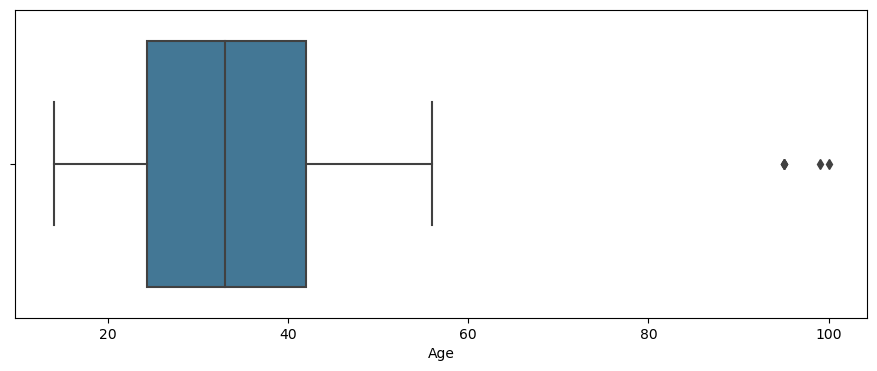

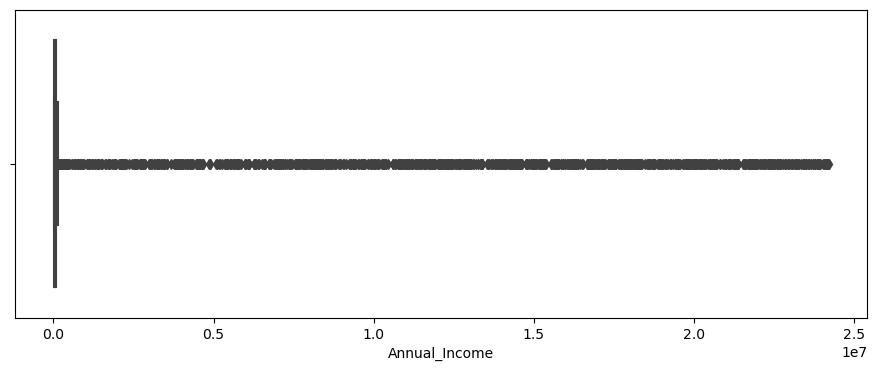

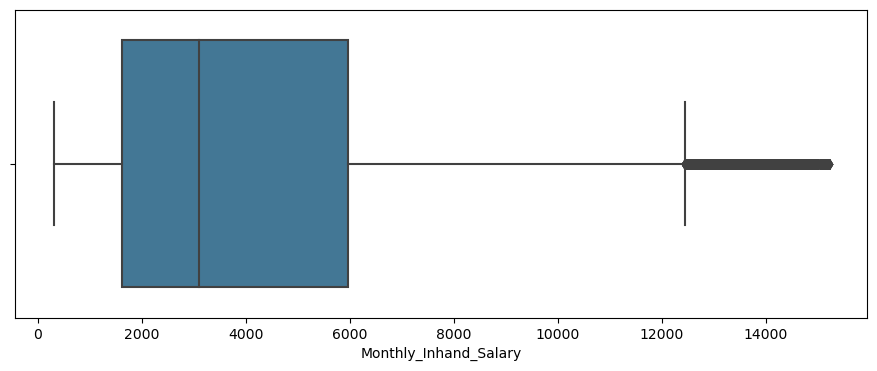

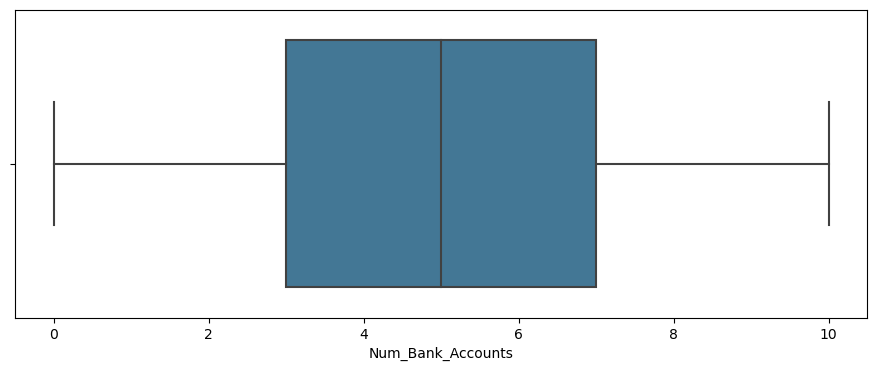

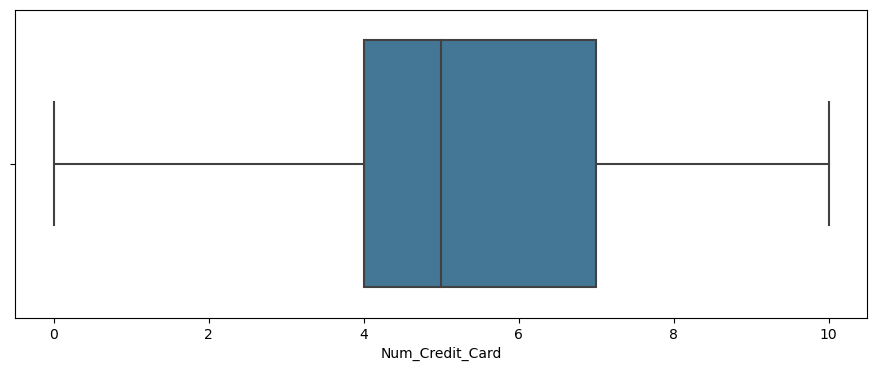

...

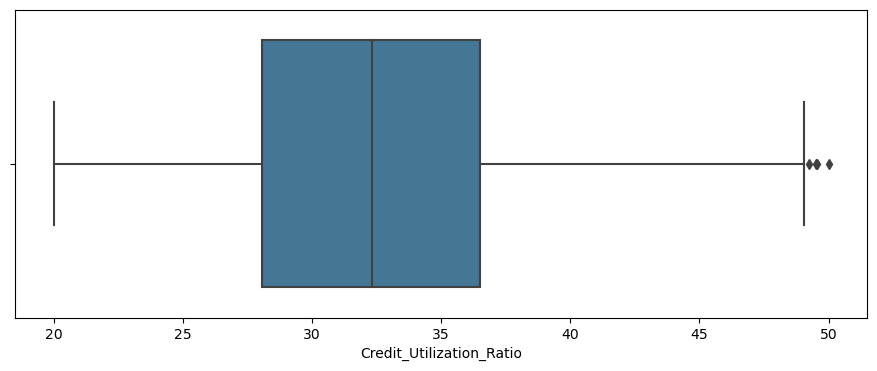

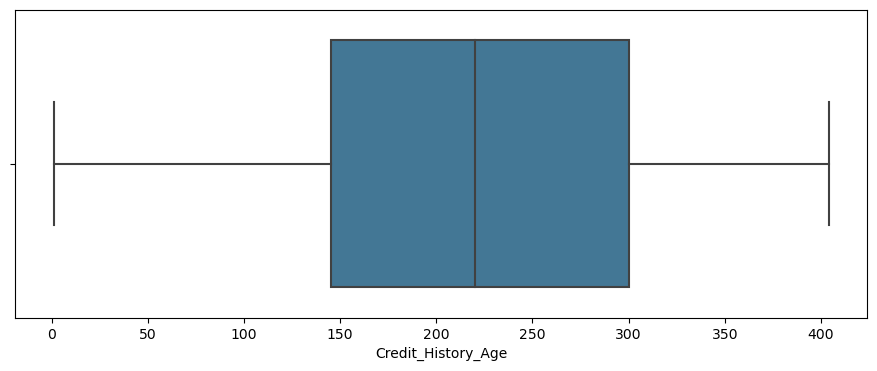

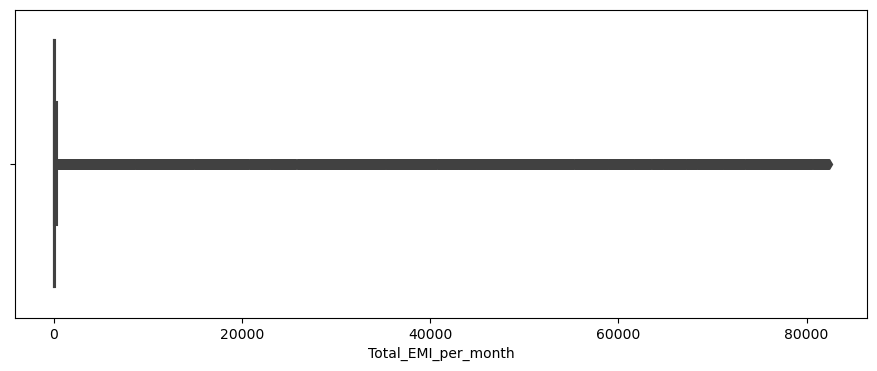

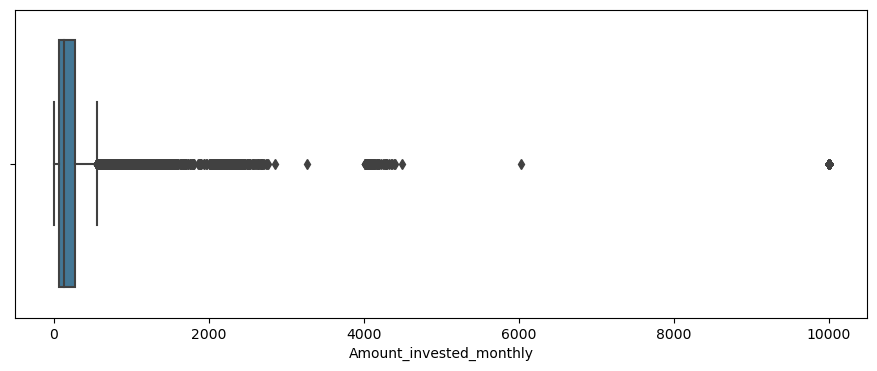

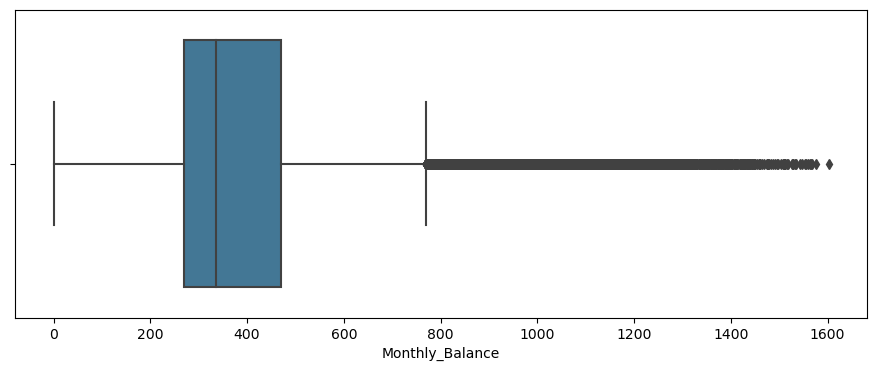

In [65]:
for col in Numeric_cols:
    plt.figure(figsize=(11,4))
    sns.boxplot(x=col,data=df, palette="mako")
    plt.show()

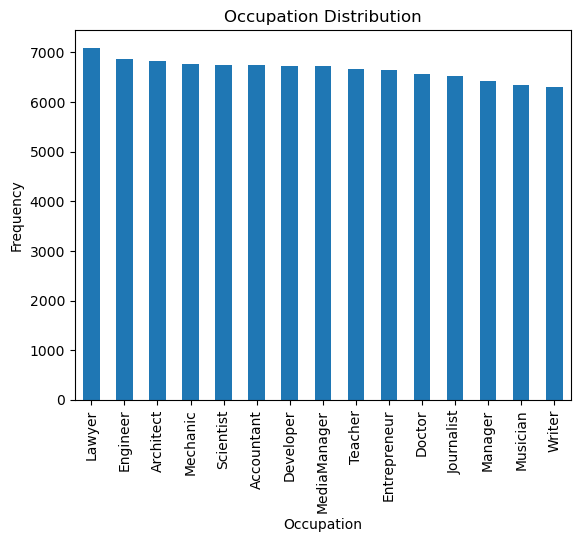

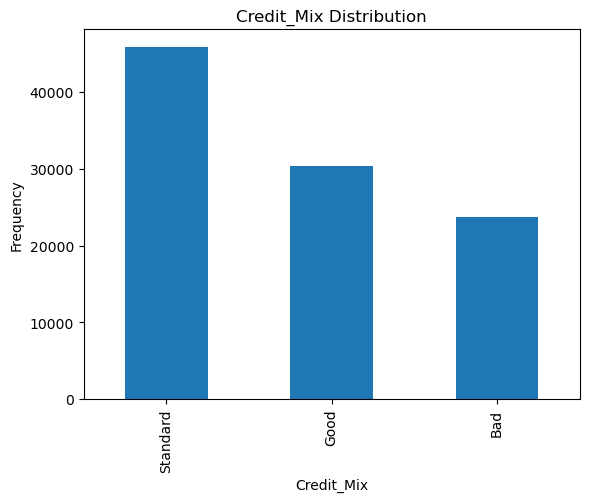

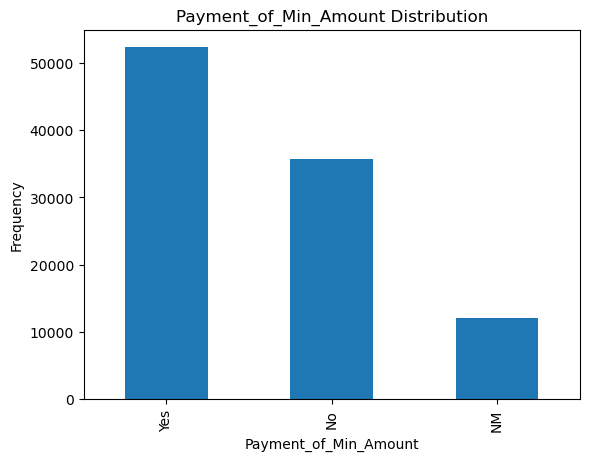

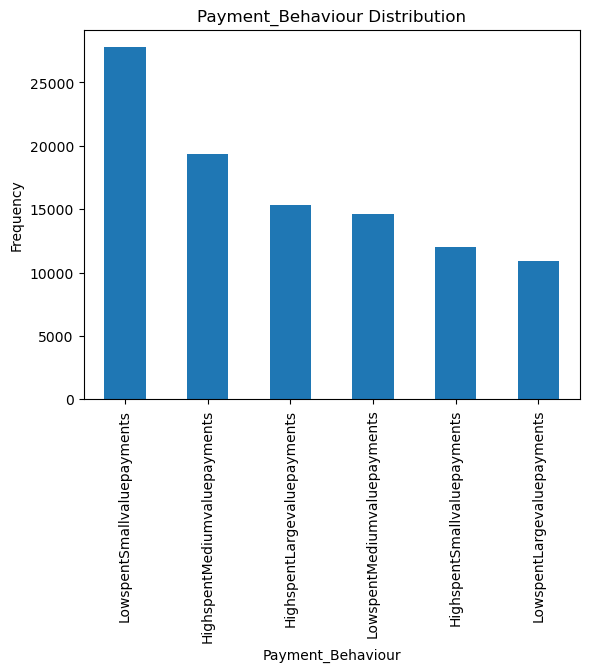

In [66]:
for col in Categoric_cols:
    df[col].value_counts().plot(kind='bar', title=f'{col} Distribution')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

### Bi - Variante - Analysis 

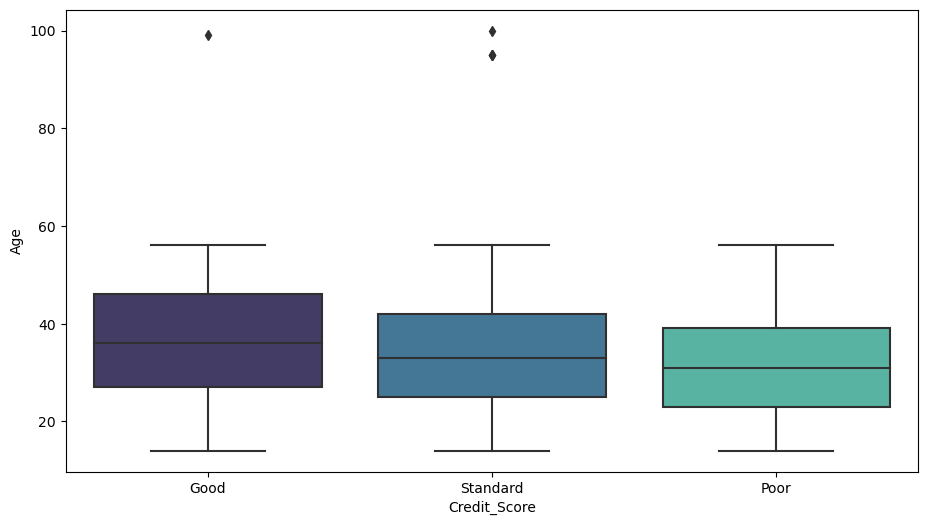

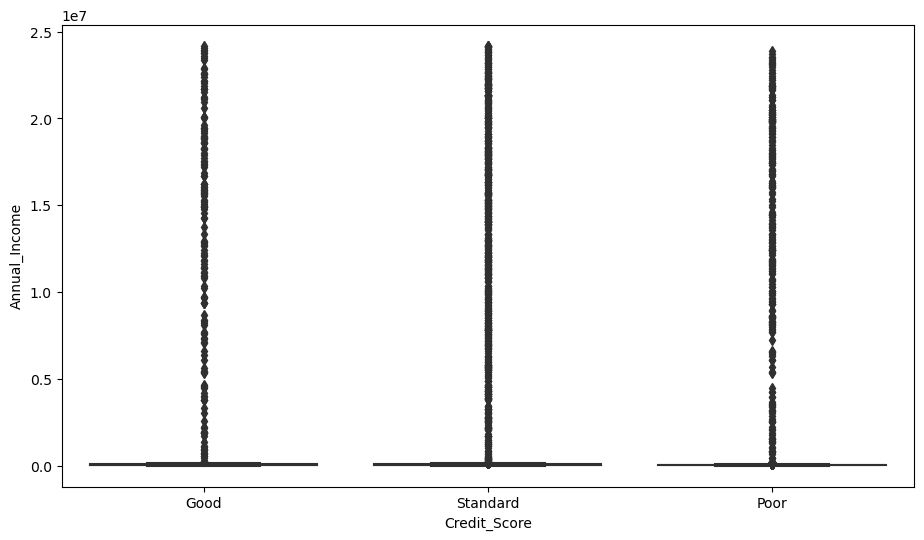

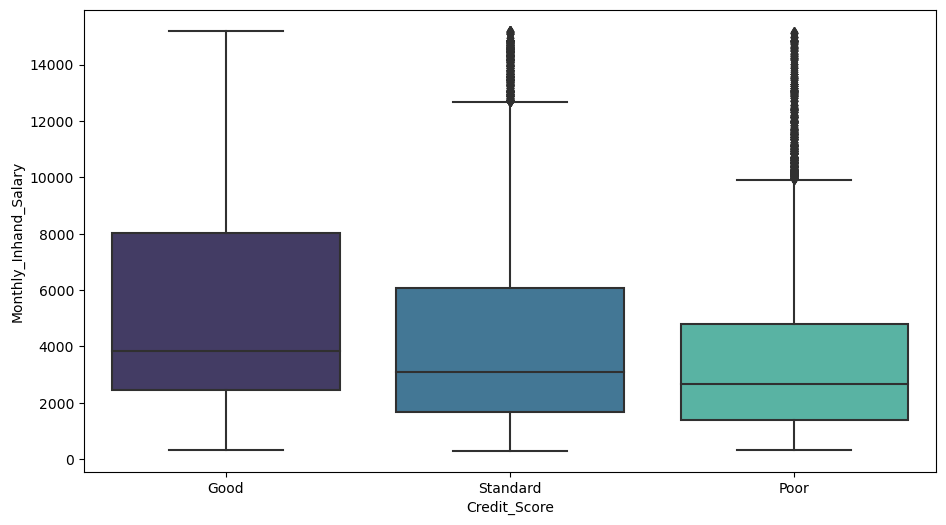

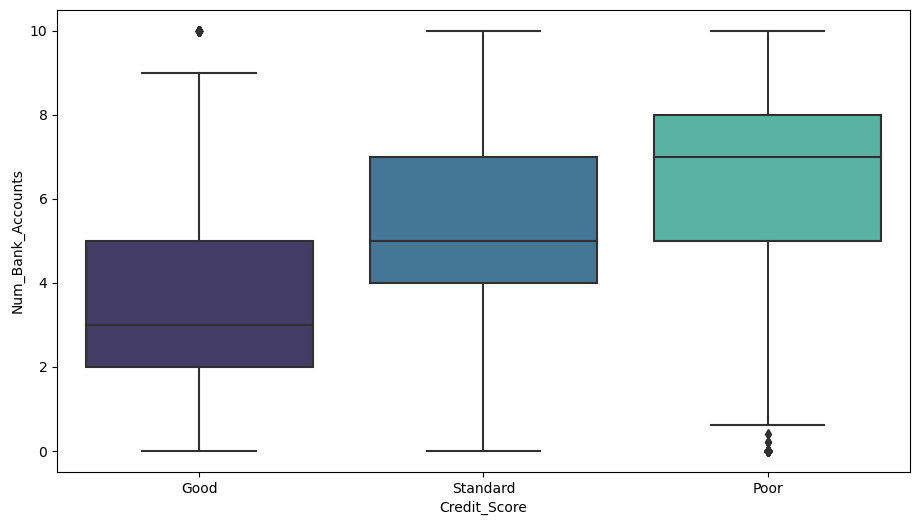

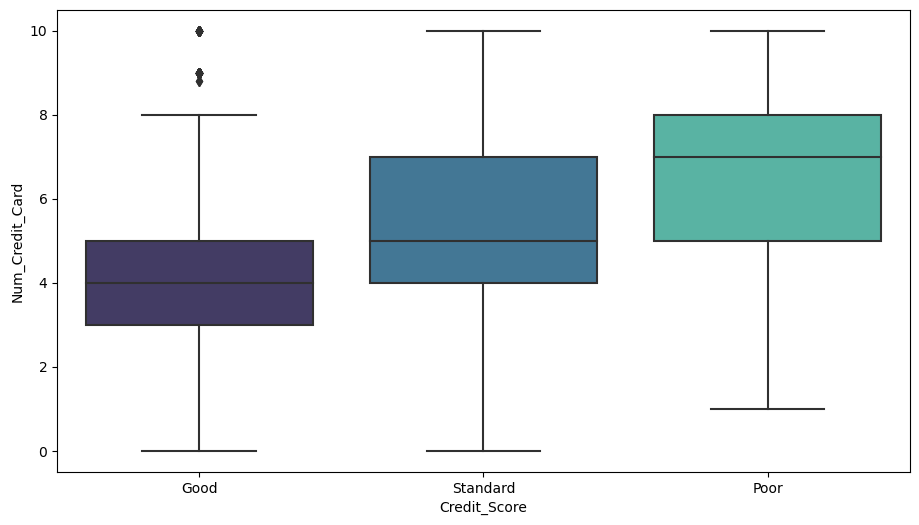

...

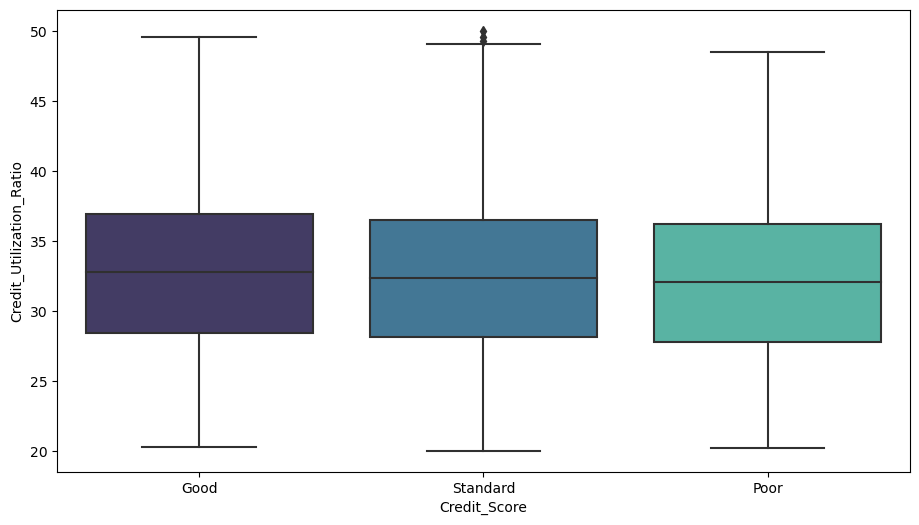

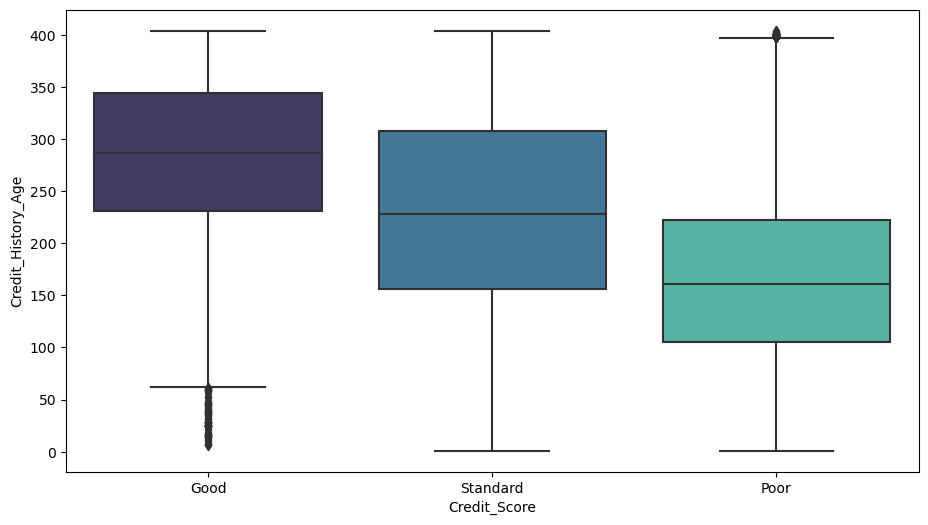

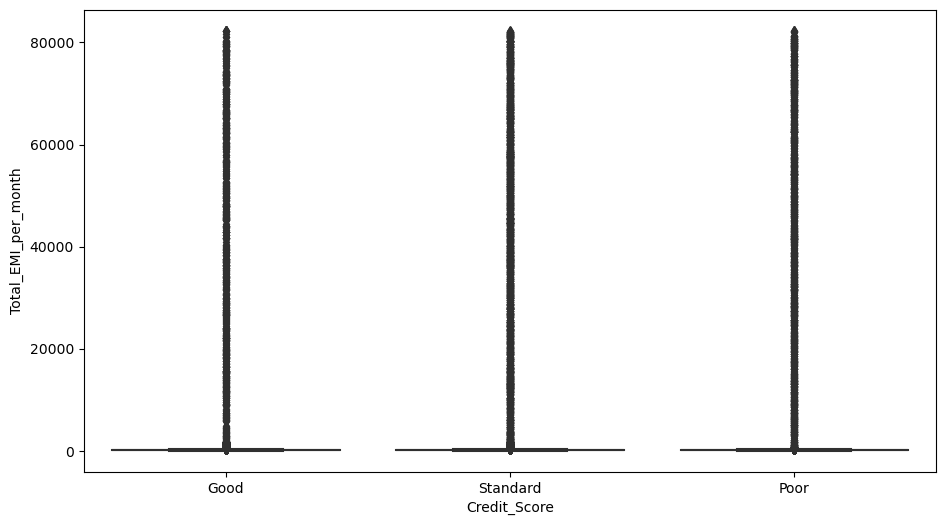

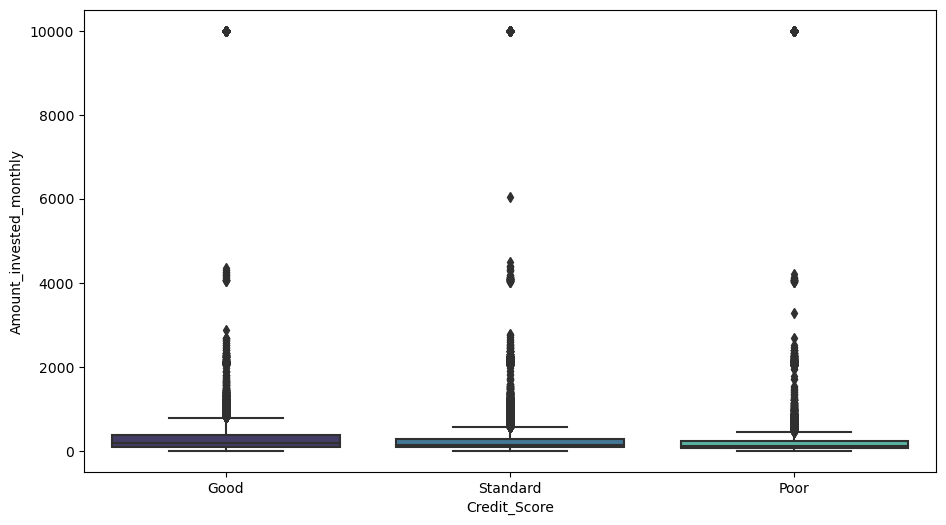

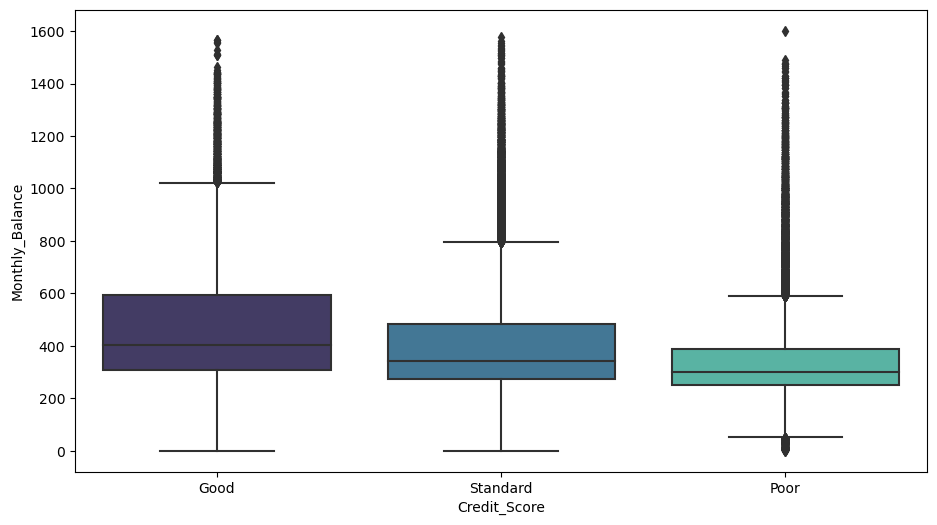

In [67]:
for col in Numeric_cols:
    plt.figure(figsize=(11,6))
    sns.boxplot(y=col,data=df, palette="mako", x="Credit_Score")
    plt.show()

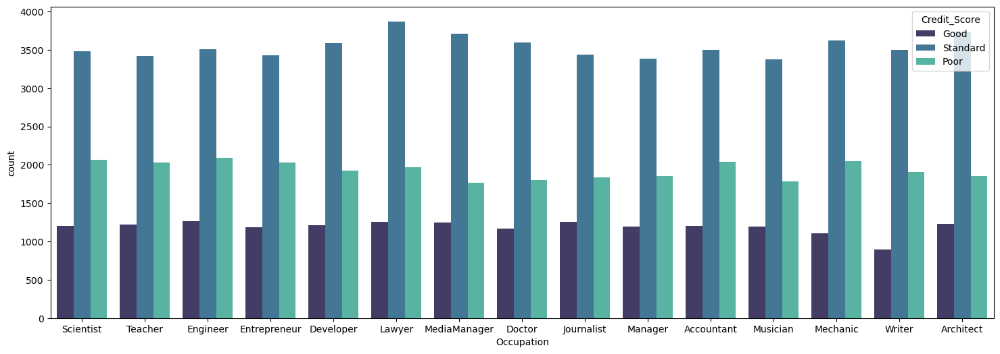

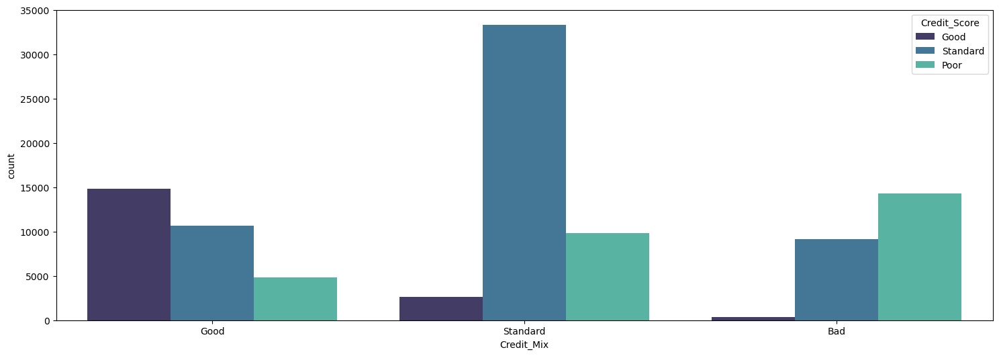

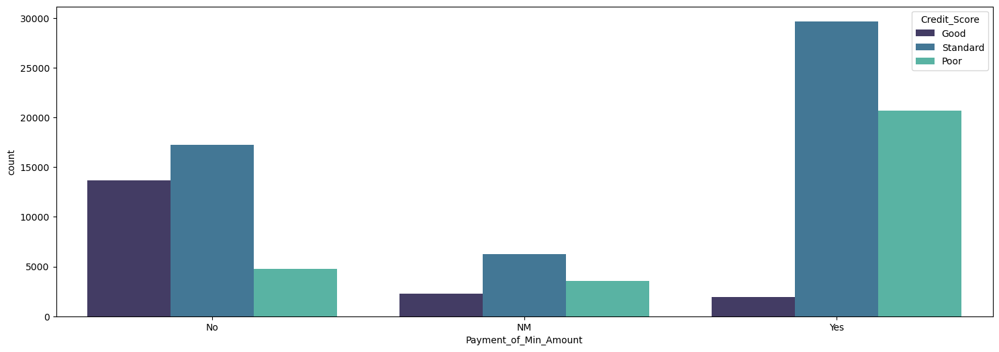

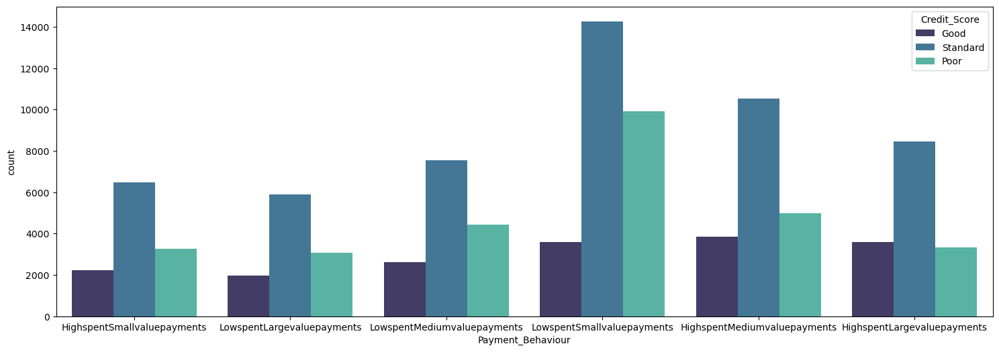

In [68]:
for col in Categoric_cols:
    plt.figure(figsize=(18,6))
    sns.countplot(x=col,data=df, palette="mako", hue="Credit_Score")
    plt.show()

### Multi - Variante - Analysis

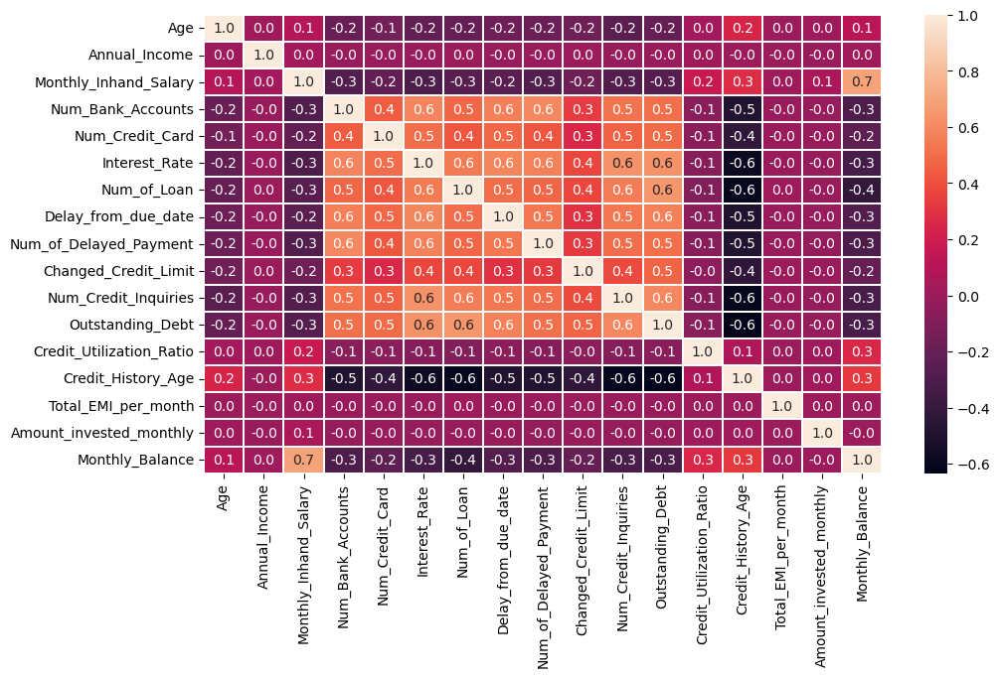

In [69]:
plt.figure(figsize=[11,6])
sns.heatmap(df.corr(),annot=True,fmt='.1f',linewidth=.2)
plt.show()

##### Outliers

In [70]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = ((df < lower_bound) | (df > upper_bound)).any(axis=1)
outliers

0        False
1        False
2        False
3        False
4        False
         ...  
99995    False
99996    False
99997    False
99998    False
99999    False
Length: 100000, dtype: bool

## Data transformation

##### Filter numerical and categorical variables.

In [71]:
df_target = df['Credit_Score']

df_feature = df.drop('Credit_Score', axis = 1)

In [72]:
df_num = df_feature.select_dtypes(include = [np.number])

df_num.columns

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly',
       'Monthly_Balance'],
      dtype='object')

In [73]:
df_cat = df_feature.select_dtypes(include = [np.object])

df_cat.columns

Index(['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount',
       'Payment_Behaviour'],
      dtype='object')

##### Scaling

In [74]:
print("Original DataFrame:")
print(df_num)

scaler = PowerTransformer(method='yeo-johnson', standardize=True)

df_num = pd.DataFrame(scaler.fit_transform(df_num), columns=df_num.columns)

print("\nDataFrame after Standard Scaling:")
print(df_num)

Original DataFrame:
        Age  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  \
0      23.0       19114.12            1824.843333                3.0   
1      23.0       19114.12            1576.640583                3.0   
2      23.0       19114.12            1659.374833                3.0   
3      23.0       19114.12            1493.906333                3.0   
4      23.0       19114.12            1824.843333                3.0   
...     ...            ...                    ...                ...   
99995  25.0       39628.99            3359.415833                4.0   
99996  25.0       39628.99            3359.415833                4.0   
99997  25.0       39628.99            3359.415833                4.0   
99998  25.0       39628.99            3359.415833                4.0   
99999  25.0       39628.99            3359.415833                4.0   

       Num_Credit_Card  Interest_Rate  Num_of_Loan  Delay_from_due_date  \
0                  4.0            3.0   

##### Encoding

In [75]:
dummy_var = pd.get_dummies(data = df_cat, drop_first = True)

In [76]:
from sklearn.preprocessing import LabelEncoder

In [77]:
lb=LabelEncoder()
df_target=lb.fit_transform(df_target)

##### Concatenate numerical and dummy encoded categorical variables.

In [78]:
X = pd.concat([df_num, dummy_var], axis = 1)

X.head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_MediaManager,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,Credit_Mix_Good,Credit_Mix_Standard,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Payment_Behaviour_HighspentMediumvaluepayments,Payment_Behaviour_HighspentSmallvaluepayments,Payment_Behaviour_LowspentLargevaluepayments,Payment_Behaviour_LowspentMediumvaluepayments,Payment_Behaviour_LowspentSmallvaluepayments
0,-0.951949,-0.798469,-0.690990,-0.918537,-0.717452,-1.566584,0.300885,-1.643007,-1.010868,0.293234,-0.325113,-0.33927,-1.069455,0.460257,-0.075694,-0.526513,-0.301722,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0
1,-0.951949,-0.798469,-0.864984,-0.918537,-0.717452,-1.566584,0.300885,-2.132256,-1.109494,0.293234,-0.325113,-0.33927,-0.045590,0.234348,-0.075694,-0.165286,-0.475420,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0
2,-0.951949,-0.798469,-0.804360,-0.918537,-0.717452,-1.566584,0.300885,-1.643007,-1.010868,0.236867,-0.325113,-0.33927,-0.706982,0.479793,-0.075694,-0.511188,-0.191397,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0
3,-0.951949,-0.798469,-0.928591,-0.918537,-0.717452,-1.566584,0.300885,-1.296232,-1.508624,-0.513335,-0.325113,-0.33927,-0.156716,0.489555,-0.075694,0.285490,-0.906324,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1
4,-0.951949,-0.798469,-0.690990,-0.918537,-0.717452,-1.566584,0.300885,-1.150832,-1.076573,0.293234,-0.325113,-0.33927,-1.487993,0.499313,-0.075694,-1.207129,-0.132755,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0


##### Train-Test Split

Before applying various classification techniques to predict the admission status of the student, let us split the dataset in train and test set.

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X, df_target, random_state = 4, test_size = 0.3)

print('X_train', X_train.shape)
print('y_train', y_train.shape)

print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (70000, 40)
y_train (70000,)
X_test (30000, 40)
y_test (30000,)


## Modeling and Evaluation


In [80]:
perf_score=pd.DataFrame(columns=['Model','Accuracy','Recall','Precision','F1 Score'])

In [81]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
 
pd.options.display.float_format = '{:.6f}'.format

from sklearn.model_selection import train_test_split


import statsmodels.api as sm

from sklearn.preprocessing import StandardScaler 

from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score

from sklearn.feature_selection import RFE

In [82]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
 
pd.options.display.float_format = '{:.6f}'.format

 

from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import classification_report,f1_score,recall_score,precision_score,accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay  #****


import pydoc
from IPython.display import Image  
import plotly.graph_objects as go
from sklearn.tree import DecisionTreeClassifier

In [83]:
def per_measures(model,test,pred):
    accuracy=accuracy_score(test,pred)
    f1score=f1_score(test,pred, average='weighted')
    recall=recall_score(test,pred, average='weighted')
    precision=precision_score(test,pred, average='weighted')
    return(accuracy,recall,precision,f1score)

In [84]:
def update_performance (name, model,test,pred):
    global perf_score

    perf_score = perf_score.append({'Model'       : name,
                                    'Accuracy'    : per_measures(model,test,pred)[0],
                                    'Recall'      : per_measures(model,test,pred)[1],
                                    'Precision'   : per_measures(model,test,pred)[2],
                                    'F1 Score'    : per_measures(model,test,pred)[3]

                                     },
                                   ignore_index=True)

In [85]:
lr=LogisticRegression()
lr.fit(X_train,y_train)

LogisticRegression()

In [86]:
coef_logit=lr.coef_
coef_logit

array([[ 3.50706445e-02, -1.16668125e-02,  5.14927041e-02,
         6.29797382e-02, -3.52709417e-01, -1.58317034e-01,
        -5.20382637e-02, -2.20179425e-01,  1.15440796e-01,
         7.96572487e-02, -6.78699968e-02, -1.20524923e-01,
        -1.66686118e-02,  9.33983245e-02,  2.66560553e-02,
         8.09328954e-03, -1.47298173e-01, -2.02834342e-02,
         3.15693655e-02,  8.37918010e-02,  8.04614409e-02,
        -2.98114350e-02,  1.31584741e-01,  5.14768022e-03,
         5.01041802e-02, -5.97123535e-02,  5.67355794e-02,
         5.86753658e-02, -3.88724932e-02,  6.47296514e-02,
        -1.15853865e-01,  1.33526488e+00,  1.53393315e-01,
         4.79115886e-02, -2.15725852e-01, -7.11381845e-02,
        -1.51538669e-01, -2.49883752e-01, -3.13402161e-01,
        -4.82583591e-01],
       [-4.29714639e-02, -1.55824691e-02, -5.28701328e-02,
         1.23965477e-02,  2.85591150e-01,  3.67109005e-01,
         5.86123132e-02,  2.91782067e-01, -4.29160759e-02,
        -2.47717257e-01,  2.49

In [87]:
coef_odd=np.exp(coef_logit)

In [88]:
lr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [89]:
res=pd.DataFrame({'Feature':X_train.columns,
                 'Logit':coef_logit[0],
                 'odd_ratio':coef_odd[0]})
res

,Feature,Logit,odd_ratio
0,Age,0.035071,1.035693
1,Annual_Income,-0.011667,0.988401
2,Monthly_Inhand_Salary,0.051493,1.052842
3,Num_Bank_Accounts,0.062980,1.065005
4,Num_Credit_Card,-0.352709,0.702781
5,Interest_Rate,-0.158317,0.853579
6,Num_of_Loan,-0.052038,0.949293
7,Delay_from_due_date,-0.220179,0.802375
8,Num_of_Delayed_Payment,0.115441,1.122368
9,Changed_Credit_Limit,0.079657,1.082916


In [90]:
ypred_lr_tr=lr.predict(X_train)
print(classification_report(y_train,ypred_lr_tr))
print(confusion_matrix(y_train,ypred_lr_tr))

              precision    recall  f1-score   support

           0       0.56      0.66      0.61     12346
           1       0.64      0.56      0.60     20315
           2       0.71      0.71      0.71     37339

    accuracy                           0.66     70000
   macro avg       0.64      0.65      0.64     70000
weighted avg       0.66      0.66      0.66     70000

[[ 8176   517  3653]
 [ 1672 11448  7195]
 [ 4830  5916 26593]]


In [91]:
ypred_lr=lr.predict(X_test)
print(classification_report(y_test,ypred_lr))
print(confusion_matrix(y_test,ypred_lr))

              precision    recall  f1-score   support

           0       0.56      0.66      0.60      5482
           1       0.64      0.57      0.60      8683
           2       0.71      0.71      0.71     15835

    accuracy                           0.66     30000
   macro avg       0.64      0.65      0.64     30000
weighted avg       0.66      0.66      0.66     30000

[[ 3600   216  1666]
 [  769  4942  2972]
 [ 2053  2533 11249]]


In [92]:
update_performance(name='LogisticReg-Base',
                  model=lr,
                  test=y_test,
                  pred=ypred_lr)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590


In [93]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(X_train,y_train)
ypred_knn=knn.predict(X_test)

In [94]:
knn.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [95]:
update_performance(name='KNeighborsClassifier',
                  model=knn,
                  test=y_test,
                  pred=ypred_knn)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304


In [96]:
ypred_knn_tr=knn.predict(X_train)

In [97]:
f1_score(y_train, ypred_knn_tr, average='weighted')

0.8339491792489809

In [98]:
dt=DecisionTreeClassifier(random_state=10)
dt.fit(X_train,y_train)
ypred_dt=dt.predict(X_test)

In [99]:
dt.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 10,
 'splitter': 'best'}

In [100]:
update_performance(name='Decision Tree-Gini',
                  model=dt,
                  test=y_test,
                  pred=ypred_dt)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342


In [101]:
ypred_dt_tr=dt.predict(X_train)
f1_score(y_train, ypred_dt_tr, average='weighted')

1.0

In [102]:
feature_imp=pd.DataFrame()
feature_imp['Feature']=X_train.columns
feature_imp['Importance']=dt.feature_importances_

In [103]:
feature_imp


,Feature,Importance
0,Age,0.034465
1,Annual_Income,0.028746
2,Monthly_Inhand_Salary,0.033823
3,Num_Bank_Accounts,0.019869
4,Num_Credit_Card,0.027787
5,Interest_Rate,0.054943
6,Num_of_Loan,0.015896
7,Delay_from_due_date,0.055568
8,Num_of_Delayed_Payment,0.037009
9,Changed_Credit_Limit,0.053040


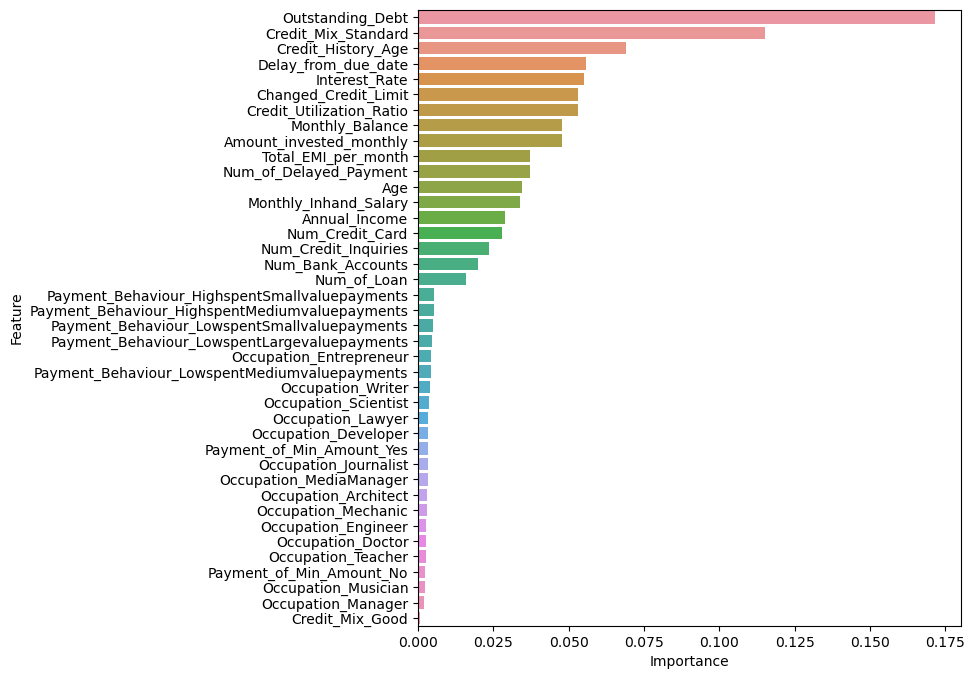

In [104]:
plt.figure(figsize=(7,8))
feature_imp=feature_imp.sort_values('Importance',ascending=False)
sns.barplot(x='Importance',y='Feature',data=feature_imp)
plt.show()

Outstanding_Debt, Credit_Mix_Standard, and Delay_from_Due_Date are the the features having most influence on target.

In [105]:
from sklearn.naive_bayes import GaussianNB
gnb=GaussianNB()
gnb.fit(X_train,y_train)
ypred_gnb=gnb.predict(X_test)

In [106]:
gnb.get_params()

{'priors': None, 'var_smoothing': 1e-09}

In [107]:
update_performance(name='Gaussian NB',
                  model= gnb,
                  test=y_test,
                  pred=ypred_gnb)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885


In [108]:
ypred_gnb_tr=gnb.predict(X_train)
f1_score(y_train, ypred_gnb_tr, average='weighted')

0.6522402023053747

In [109]:
from sklearn.ensemble import RandomForestClassifier

In [110]:
rf=RandomForestClassifier(random_state=10)
rf.fit(X_train,y_train)
ypred_rf=rf.predict(X_test)

In [111]:
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 10,
 'verbose': 0,
 'warm_start': False}

In [112]:
update_performance(name='Random Forest',
                  model=rf,
                  test=y_test,
                  pred=ypred_rf)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588


In [113]:
ypred_rf_tr=rf.predict(X_train)
f1_score(y_train, ypred_rf_tr, average='weighted')

1.0

In [114]:
from sklearn.ensemble import BaggingClassifier
dt=DecisionTreeClassifier(random_state=10)
bc=BaggingClassifier(dt)
bc.fit(X_train,y_train)
ypred_bc=bc.predict(X_test)


In [115]:
bc.get_params()

{'base_estimator': 'deprecated',
 'bootstrap': True,
 'bootstrap_features': False,
 'estimator__ccp_alpha': 0.0,
 'estimator__class_weight': None,
 'estimator__criterion': 'gini',
 'estimator__max_depth': None,
 'estimator__max_features': None,
 'estimator__max_leaf_nodes': None,
 'estimator__min_impurity_decrease': 0.0,
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 2,
 'estimator__min_weight_fraction_leaf': 0.0,
 'estimator__random_state': 10,
 'estimator__splitter': 'best',
 'estimator': DecisionTreeClassifier(random_state=10),
 'max_features': 1.0,
 'max_samples': 1.0,
 'n_estimators': 10,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [116]:
update_performance(name='Bagging Classifier-dt',
                  model=bc,
                  test=y_test,
                  pred=ypred_bc)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403


In [117]:
ypred_bc_tr=bc.predict(X_train)
f1_score(y_train, ypred_bc_tr, average='weighted')

0.9854354433768298

In [118]:
from sklearn.ensemble import AdaBoostClassifier
abcl=AdaBoostClassifier(dt,random_state=10)
abcl.fit(X_train,y_train)
ypred_abcl=abcl.predict(X_test)

In [119]:
abcl.get_params()

{'algorithm': 'SAMME.R',
 'base_estimator': 'deprecated',
 'estimator__ccp_alpha': 0.0,
 'estimator__class_weight': None,
 'estimator__criterion': 'gini',
 'estimator__max_depth': None,
 'estimator__max_features': None,
 'estimator__max_leaf_nodes': None,
 'estimator__min_impurity_decrease': 0.0,
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 2,
 'estimator__min_weight_fraction_leaf': 0.0,
 'estimator__random_state': 10,
 'estimator__splitter': 'best',
 'estimator': DecisionTreeClassifier(random_state=10),
 'learning_rate': 1.0,
 'n_estimators': 50,
 'random_state': 10}

In [120]:
update_performance(name='Adaboost-dt',
                  model=abcl,
                  test=y_test,
                  pred=ypred_abcl)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502


In [121]:
ypred_abcl_tr=abcl.predict(X_train)
f1_score(y_train, ypred_abcl_tr, average='weighted')

1.0

In [128]:
from xgboost import XGBClassifier

In [129]:
xgb=XGBClassifier(random_state=10)
xgb.fit(X_train,y_train)
ypred_xgb=xgb.predict(X_test)
print(accuracy_score(y_test,ypred_xgb))

0.7684


In [130]:
xgb.get_params()

{'objective': 'multi:softprob',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': None,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': 10,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [131]:
ypred_xgb_tr=xgb.predict(X_train)
f1_score(y_train, ypred_xgb_tr, average='weighted')

0.8326495575077902

In [132]:
update_performance(name='XGBoost',
                  model=xgb,
                  test=y_test,
                  pred=ypred_xgb)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676


Choosing XGBoost as the best model before SMOTE. Weighted F1 score 76% in test data and 83% in training data.

In [133]:
from sklearn.model_selection import GridSearchCV,KFold

In [134]:
kf=KFold(n_splits=5,
         shuffle=True,
         random_state=0)

In [135]:
param_xg = {
    'learning_rate': [0.01, 0.1],
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

grid_search = GridSearchCV(estimator=xgb, param_grid=param_xg, scoring='accuracy', cv=kf, n_jobs=-1)

grid_search.fit(X_train, y_train)

print("Best Hyperparameters:", grid_search.best_params_)


Best Hyperparameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}


In [136]:
xgb_tuned=XGBClassifier(random_state=10, colsample_bytree=1.0, learning_rate=0.1, max_depth= 5, n_estimators= 200, subsample=0.8)
xgb_tuned.fit(X_train,y_train)
ypred_xgb_tuned=xgb.predict(X_test)


In [137]:
xgb_tuned.get_params()

{'objective': 'multi:softprob',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': 1.0,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': 0.1,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': 5,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': 200,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': 10,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': 0.8,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [138]:
update_performance(name='XGBoost_tuned',
                  model=xgb_tuned,
                  test=y_test,
                  pred=ypred_xgb_tuned)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676
9,XGBoost_tuned,0.768400,0.768400,0.769101,0.768676


In [139]:
ypred_xgt_tr=xgb_tuned.predict(X_train)
f1_score(y_train, ypred_xgt_tr, average='weighted')

0.7697655340845995

# Performing SMOTE

In [140]:
from imblearn.over_sampling import SMOTE

In [141]:
smote = SMOTE(sampling_strategy={0: 45000, 1: 45000, 2: 45000}, random_state=1)
Xtrain_sm, ytrain_sm = smote.fit_resample(X_train,y_train)

In [142]:
Xtrain_sm.shape

(135000, 40)

In [143]:
lr_smote=LogisticRegression()
lr_smote.fit(Xtrain_sm,ytrain_sm)

y_pred_lr_smote=lr_smote.predict(X_test)

In [144]:
update_performance(name='LogisticReg-Base-smote',
                  model=lr_smote,
                  test=y_test,
                  pred=y_pred_lr_smote)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676
9,XGBoost_tuned,0.768400,0.768400,0.769101,0.768676


In [145]:
ypred_lrsm_tr=stack.predict(Xtrain_sm)
f1_score(ytrain_sm, ypred_lrsm_tr, average='weighted')

0.8794865646662537

In [146]:
knn.fit(Xtrain_sm,ytrain_sm)
ypred_knn_sm=knn.predict(X_test)

In [147]:
update_performance(name='KNeighborsClassifier after SMOTE',
                  model=knn,
                  test=y_test,
                  pred=ypred_knn_sm)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676
9,XGBoost_tuned,0.768400,0.768400,0.769101,0.768676


In [148]:
ypred_knnsm_tr=knn.predict(Xtrain_sm)
f1_score(ytrain_sm, ypred_knnsm_tr, average='weighted')

0.9119013299731625

In [149]:
dt.fit(Xtrain_sm,ytrain_sm)
ypred_dt_sm=dt.predict(X_test)

In [150]:
update_performance(name='Decision Tree after SMOTE',
                  model=dt,
                  test=y_test,
                  pred=ypred_dt_sm)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676
9,XGBoost_tuned,0.768400,0.768400,0.769101,0.768676


In [151]:
ypred_dtsm_tr=dt.predict(Xtrain_sm)
f1_score(ytrain_sm, ypred_dtsm_tr, average='weighted')

1.0

In [152]:
gnb.fit(Xtrain_sm,ytrain_sm)
ypred_gnb_sm=gnb.predict(X_test)

In [153]:
update_performance(name='GaussianNB after SMOTE',
                  model=gnb,
                  test=y_test,
                  pred=ypred_gnb_sm)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676
9,XGBoost_tuned,0.768400,0.768400,0.769101,0.768676


In [154]:
ypred_gnsm_tr=gnb.predict(Xtrain_sm)
f1_score(ytrain_sm, ypred_gnsm_tr, average='weighted')

0.6944268612937413

In [ ]:
from sk

In [155]:
rf=RandomForestClassifier(random_state=10)
rf.fit(Xtrain_sm,ytrain_sm)
ypred_rf_sm=rf.predict(X_test)

In [156]:
update_performance(name='Random Forest after SMOTE',
                  model=rf,
                  test=y_test,
                  pred=ypred_rf_sm)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676
9,XGBoost_tuned,0.768400,0.768400,0.769101,0.768676


In [174]:
ypred_rfsm_tr=gnb.predict(Xtrain_sm)
f1_score(ytrain_sm, ypred_rfsm_tr, average='weighted')

0.6944268612937413

In [158]:
xgb.fit(Xtrain_sm,ytrain_sm)
ypred_xgb_sm=xgb.predict(X_test)
print(accuracy_score(y_test,ypred_xgb_sm))

0.7570666666666667


In [159]:
update_performance(name='XGBoost after SMOTE',
                  model=xgb,
                  test=y_test,
                  pred=ypred_xgb_sm)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676
9,XGBoost_tuned,0.768400,0.768400,0.769101,0.768676


In [160]:
ypred_xgsm_tr=xgb.predict(Xtrain_sm)
f1_score(ytrain_sm, ypred_xgsm_tr, average='weighted')

0.8498801611260418

In [161]:
dt=DecisionTreeClassifier(random_state=10)
bc=BaggingClassifier(dt)
bc.fit(Xtrain_sm,ytrain_sm)
ypred_bc_sm=bc.predict(X_test)

In [162]:
update_performance(name='Bagging Classifier-dt after SMOTE',
                  model=bc,
                  test=y_test,
                  pred=ypred_bc_sm)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676
9,XGBoost_tuned,0.768400,0.768400,0.769101,0.768676


In [163]:
ypred_bcsm_tr=bc.predict(Xtrain_sm)
f1_score(ytrain_sm, ypred_bcsm_tr, average='weighted')

0.9900591134279395

In [164]:
abcl=AdaBoostClassifier(dt,random_state=10)
abcl.fit(Xtrain_sm,ytrain_sm)
ypred_abclsm=abcl.predict(X_test)

In [165]:
update_performance(name='Adaboost-dt after SMOTE',
                  model=abcl,
                  test=y_test,
                  pred=ypred_abclsm)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676
9,XGBoost_tuned,0.768400,0.768400,0.769101,0.768676


In [166]:
ypred_abclsm_tr=abcl.predict(Xtrain_sm)
f1_score(ytrain_sm, ypred_abclsm_tr, average='weighted')

1.0

In [170]:
xgb_tuned_sm=XGBClassifier(random_state=10, colsample_bytree=1.0, learning_rate=0.1, max_depth= 5, n_estimators= 200, subsample=0.8)
xgb_tuned_sm.fit(Xtrain_sm,ytrain_sm)
ypred_xgbsm_tuned=xgb.predict(X_test)

In [171]:
update_performance(name='XGBoost_tuned_after SMOTE',
                  model=xgb_tuned_sm,
                  test=y_test,
                  pred=ypred_xgbsm_tuned)
perf_score

,Model,Accuracy,Recall,Precision,F1 Score
0,LogisticReg-Base,0.659700,0.659700,0.662156,0.659590
1,KNeighborsClassifier,0.749867,0.749867,0.751004,0.750304
2,Decision Tree-Gini,0.721400,0.721400,0.721314,0.721342
3,Gaussian NB,0.650767,0.650767,0.708344,0.653885
4,Random Forest,0.805600,0.805600,0.806000,0.805588
5,Bagging Classifier-dt,0.789233,0.789233,0.790775,0.789403
6,Adaboost-dt,0.721533,0.721533,0.721519,0.721502
7,stacking model,0.765700,0.765700,0.776641,0.766186
8,XGBoost,0.768400,0.768400,0.769101,0.768676
9,XGBoost_tuned,0.768400,0.768400,0.769101,0.768676


In [172]:
ypred_xgtsm_tr=xgb_tuned_sm.predict(Xtrain_sm)
f1_score(ytrain_sm, ypred_xgtsm_tr, average='weighted')

0.7909791761039335

### Choosing XGBoost as the best model before SMOTE and tuning. Weighted F1 score 76% in test data and 83% in training data.